In [1]:
# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib as mpl
from collections import defaultdict

In [3]:
# configure matplotlib
%matplotlib notebook
# %matplotlib inline

In [4]:
#mpl.rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
mpl.rc('font',**{'family':'serif'})
mpl.rc('text', usetex=True)
mpl.rcParams['text.latex.preamble']=r"\usepackage{amsmath}"

In [5]:
from cdi.util.stats_utils import load_statistics

from cdi.util.analysis.plotting import plot_comparison, plot_seaborn_comparison, barplot_comparison
from cdi.util.analysis.logs import collate_stats
from cdi.util.analysis.eval import (compute_avg_loglikelihood_w_std_err,
                                    compute_param_error)

## Analysis setup

### Global settings

In [6]:
data_name = 'fcvae_frey_processed'
# exp_seed_key = 'm20190508_d20200325_20200406_20200407'
exp_seed_keys = [
    'm20190508_d20200325_20200406_20200407',
    'm2019050811_d2020032511_20200406_20200407',
    'm2019050822_d2020032522_20200406_20200407',
    'm2019050833_d2020032533_20200406_20200407',
    'm2019050844_d2020032544_20200406_20200407',
]

### Templates

In [7]:
log_path_template = f'../../trained_models/{data_name}/learning_experiments/{{}}/{{}}/{{}}/logs/{{}}'
log_path_template_val = f'../../trained_models/{data_name}/learning_experiments/{{}}/{{}}/{{}}/logs_{{}}/{{}}'
log_path_base = f'../../trained_models/{data_name}/learning_experiments'

## Helpers

In [8]:
def read_experiment_stats(group, model, seed, filename):
    path = log_path_template.format(group, model, seed, filename)
    filename = os.path.basename(path)
    dirpath = os.path.dirname(path)
    return load_statistics(dirpath, filename)

def read_experiment_stats_val(group, model, seed, val_ckpt, filename):
    path = log_path_template_val.format(group, model, seed, val_ckpt, filename)
    filename = os.path.basename(path)
    dirpath = os.path.dirname(path)
    return load_statistics(dirpath, filename)

def read_experiment_stats_all_seeds(group, model, filename):
    all_stats = defaultdict(list)
    for exp_seed in exp_seed_keys:
        path = log_path_template.format(group, model, exp_seed, filename)
        filename = os.path.basename(path)
        dirpath = os.path.dirname(path)
        stats = load_statistics(dirpath, filename)
        for k, v in stats.items():
            all_stats[k].append(v)
    
    return all_stats

def read_suite_stats_all_seeds(group, suite, filename):
    return {
        name: read_experiment_stats_all_seeds(group, model, filename)
        for name, model in suite.items()
    }

def read_suite_stats(group, suite, filename, seed):
    return {
        name: read_experiment_stats(group, model, seed, filename)
        for name, model in suite.items()
    }

def read_suite_stats_val(group, suite, filename, val_ckpts, seed):
    stats = {}
    for name, model in suite.items():
        for ckpt in val_ckpts[name]:
            name_i = f'{name} val{ckpt}'
            ckpt_name = f'{ckpt}_cust'
            try:
                stats[name_i] = read_experiment_stats_val(group, model, seed, ckpt_name, filename)
            except FileNotFoundError as err:
#                 print('Error:', err)
                continue
    return stats

def read_suite_stats_val2(group, suite, filename, val_ckpts, seed):
    stats = {}
    for name, model in suite.items():
        stats_i = defaultdict(list)
        for ckpt in val_ckpts[name]:
            try:
                ckpt_name = f'{ckpt}_cust'
                stat = read_experiment_stats_val(group, model, seed, ckpt_name, filename)
                for k, v in stat.items():
                    # Append the last element from each key
                    stats_i[k].append(v[-1])
                stats_i['epoch'].append(ckpt)
            except FileNotFoundError as err:
#                 print('Error:', err)
                continue
        stats[name] = stats_i
    return stats

def read_suite_stats_with_init_all_seeds(group, suite):
    stats = {}
    for name, model in suite.items():
        stats[name] = read_experiment_stats_all_seeds(group, model, 'summary.csv')
        # Please ignore this ugliness it just appends the initialisation stats to the experiment stats
        if os.path.exists(log_path_template.format(group, model, exp_seed_keys[0], 'init_summary.csv')):
            init_stats = read_experiment_stats_all_seeds(group, model, 'init_summary.csv')
            stats[name]['init'] = init_stats

    return stats

def read_suite_stats_with_init(group, suite, seed):
    stats = {}
    for name, model in suite.items():
        stats[name] = read_experiment_stats(group, model, seed, 'summary.csv')
        # Please ignore this ugliness it just appends the initialisation stats to the experiment stats
        if os.path.exists(log_path_template.format(group, model, seed, 'init_summary.csv')):
            init_stats = read_experiment_stats(group, model, seed, 'init_summary.csv')
            stats[name]['init'] = init_stats

    return stats

##

def read_all_suite_stats(groups, suite, filename, seed):
    return {
        group: read_suite_stats(group, suite, filename, seed)
        for group in groups
    }


def ma(a, ws=10):
    return np.convolve(a[::-1], np.ones(ws)/ws, mode='valid')[::-1]

In [9]:
# ggplot
colors = ['#000000', '#E24A33', '#988ED5', '#34b9bd', '#FBC15E', '#348ABD', '#FFB5B8', '#777777', '#8EBA42',]

## Learning curve analysis

### Likelihood analysis


#### Log-likelihood vs epoch

##### TEMP

In [10]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
#     'VAE (Complete)': 'fcvae_complete_data',
#     'VAE (Complete) Subsampled': 'fcvae_complete_data_subsampled',
#     'VGI': 'fcvae_pretrained_svar_cdi_const_incomp_eval_imprej',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_incomp_eval_imprej',
#     'MICE': 'fcvae_mice_baseline',
    'MVAE': 'fc_mvae',
    'MCVAE marginalise': 'fcvae_mcimp_marginalise',
    'BVCDI var imp (xo)': 'fcvae_mcimp_bvgi2_vardecinputxmask',
}

suite_val = {
#     'VAE (Complete) Subsampled': 'fcvae_complete_data_subsampled_val',
#     'VGI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
    'MVAE': 'fc_mvae_val',
#     'MVAE z50': 'fc_mvae_z50_val',
#     'HI-VAE': 'fc_hivae_val',
#     'PartialVAE+': 'fc_pvae_val',
#     'PartialVAE+': 'fc_pvae_noaggact_val_lr5e-5',
#     'MIWAE': 'fc_miwae_val',
    'MCVAE marginalise': 'fcvae_mcimp_marginalise_val',
    'BVCDI var imp (xo)': 'fcvae_mcimp_bvgi2_vardecinputxmask_val',
}

val_ckpts = {
    'VAE (Complete) Subsampled': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MIWAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE z50': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VGI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'MCVAE marginalise': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'BVCDI var imp (xo)': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


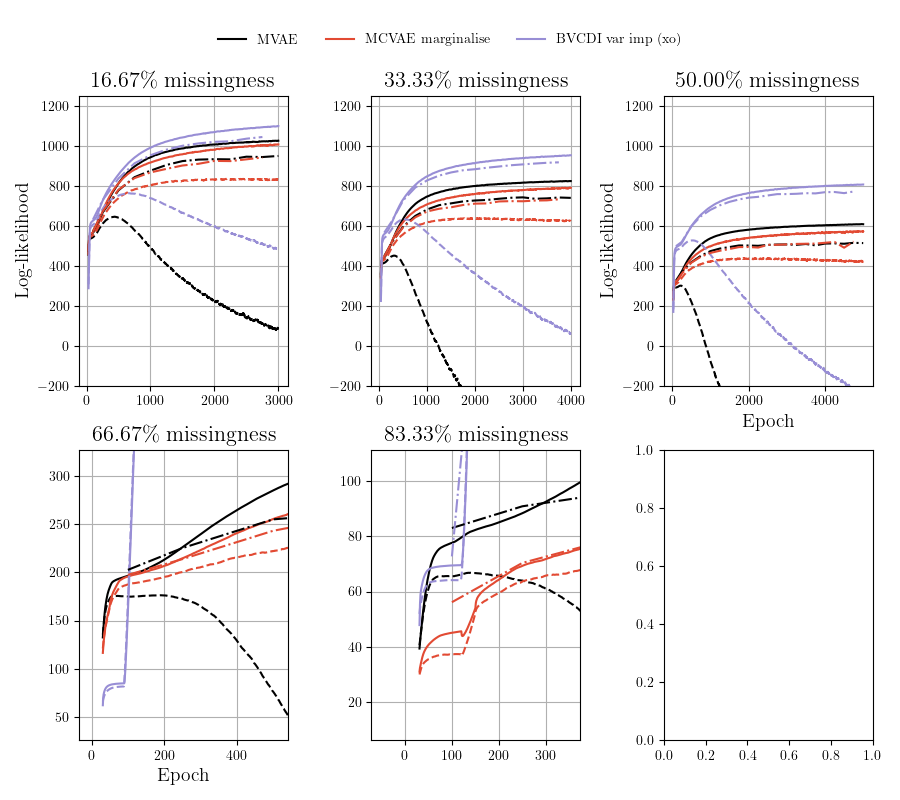

In [11]:
fig, axes = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False, figsize=(9, 8))
axes = axes.flatten()
seed_idx = 0
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1, 3, 5]
# gs = [1, 5]
# gs = [5]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[seed_idx], filename='summary.csv')
    
    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
            stat['val_log_lik'] = stat['aug_val_log_lik']
        elif 'MCVAE' in exp or 'BVCDI' in exp:
            stat['val_log_lik'] = stat['aug_val_log_lik']
        else:
            stat['val_log_lik'] = stat['val_log_lik']
            
    window_size = 30
    for method in stats.keys():
        for metric in ('train_log_lik', 'val_log_lik'):
            stats[method][metric] = ma(stats[method][metric], ws=window_size)
        stats[method]['curr_epoch'] = stats[method]['curr_epoch'][window_size-1:]

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
#                     y_metric_keys=('train_log_lik', ),
#                     err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
#                     ylim=(-100, 200),
#                     legend=False,
                    colors=colors,
                   legend=False)
    
#     axes[i].set_xlim(0, 300)

for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[seed_idx], val_ckpts=val_ckpts, filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
    
    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    no_label=True,
                    styles=['-.'],
                    legend=False,
                    colors=colors)

    axes[i].grid()


fig.tight_layout(rect=(0, 0, 1, 0.93))

# recttuple (left, bottom, right, top)
axes[0].legend(ncol=4, bbox_to_anchor=(0.5, 0.95), bbox_transform=fig.transFigure, loc='center', 
               frameon=False)




###### MCVAE

In [62]:
suite = {
#     'MCVAE': 'fcvae_mcimp_val',
#     'MCVAE marginalise true': 'fcvae_mcimp_marginalise_true_val',
    'MCVAE marg. true sample': 'fcvae_mcimp_marginalise_true_sample_val',
#     'VAE (Complete) Subsampled': 'fcvae_complete_data_subsampled_val',
}

val_ckpts = {
    'MCVAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE (Complete) Subsampled': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MCVAE marginalise true': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MCVAE marg. true sample': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


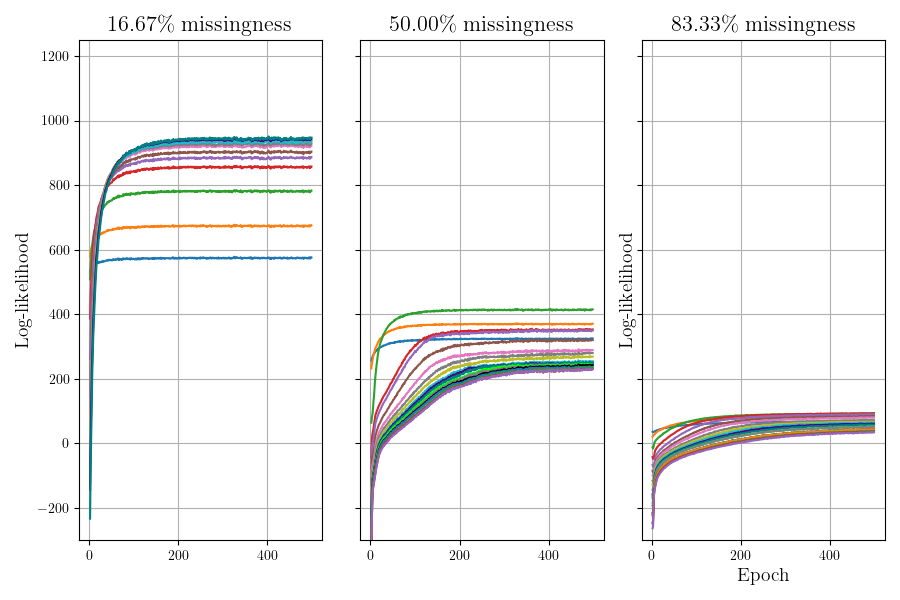

In [63]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(9, 6))
axes = axes.flatten()
# axes = [axes]
# gs = [1, 2, 3, 4, 5]
gs = [1,3,5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    legend=False,
                    ylim=(-300, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>


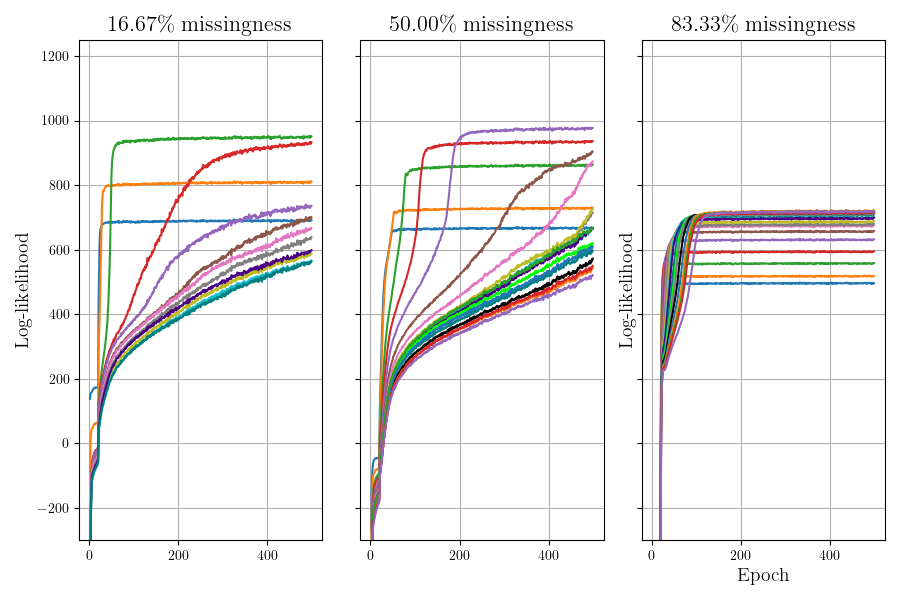

In [55]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(9, 6))
axes = axes.flatten()
# axes = [axes]
# gs = [1, 2, 3, 4, 5]
gs = [1,3,5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    legend=False,
                    ylim=(-300, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### General

In [20]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE (Complete)': 'fcvae_complete_data',
    'VGI': 'fcvae_pretrained_svar_cdi_const',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise',
    
    'MICE': 'fcvae_mice_baseline',
    'MVAE': 'fc_mvae',
    'HI-VAE': 'fc_hivae',
    'PartialVAE+': 'fc_pvae_noaggact',
    'MIWAE': 'fc_miwae',
#     "MIWAE (Complete)": "fc_miwae_complete",
#     "MVAE (Complete)": "fc_mvae_complete"
}

suite_val = {
    'VGI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
    
    'MVAE': 'fc_mvae_val',
    'HI-VAE': 'fc_hivae_val',
    'PartialVAE+': 'fc_pvae_noaggact_val_lr5e-5',
    'MIWAE': 'fc_miwae_val',
}

val_ckpts = {
    'MIWAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VGI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
#     'VGI-VAE': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


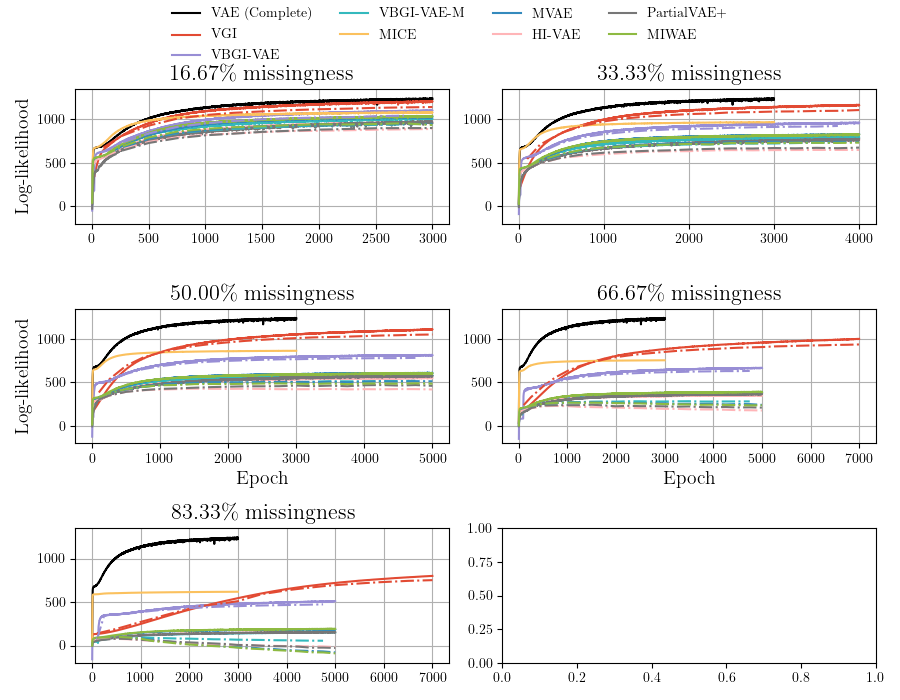

In [22]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 7))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1, 3, 5]
# gs = [1, 3]
# gs = [5]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')
    
    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik'),
#                     err_keys=(None, None,),
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    legend=False,
                    colors=colors)

for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
    
    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1350),
                    no_label=True,
                    styles=['-.'],
                    legend=False,
                    colors=colors[1:4] + colors[5:])

    axes[i].grid()


fig.tight_layout(rect=(0, 0, 1, 0.93))

# recttuple (left, bottom, right, top)
axes[0].legend(ncol=4, bbox_to_anchor=(0.5, 0.95), bbox_transform=fig.transFigure, loc='center', 
               frameon=False)




##### VAE-based methods

In [12]:
suite = {
    'MVAE': 'fc_mvae',
    'HI-VAE': 'fc_hivae',
#     'PartialVAE+': 'fc_pvae',
    'PartialVAE+': 'fc_pvae_noaggact',
    'MIWAE': 'fc_miwae',
}

suite_val = {
    'MVAE': 'fc_mvae_val',
    'HI-VAE': 'fc_hivae_val',
#     'PartialVAE+': 'fc_pvae_val',
    'PartialVAE+': 'fc_pvae_noaggact_val_lr5e-5',
    'MIWAE': 'fc_miwae_val',
}

val_ckpts = {
    'MIWAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


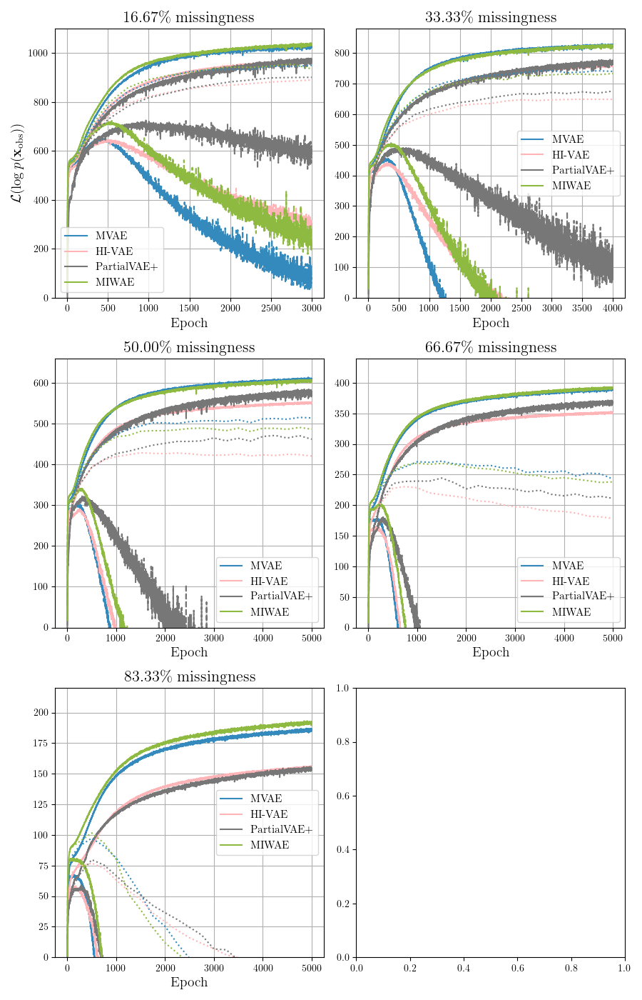

In [13]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1,2,3,4,5]
# gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
ylims = [(0, 1100), (0, 880), (0, 660), (0, 440), (0, 220)]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{L}(\log p(\mathbf{x}_{\mathrm{obs}}))$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
#                     ylim=(-200, 1250)
                    ylim=ylims[i],
                    colors=colors[4:]
                   )

for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{L}(\log p(\mathbf{x}_{\mathrm{obs}}))$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
#                     ylim=(-200, 1250),
#                     ylim=ylims[i],
                    colors=colors[4:],
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### MIWAE

In [14]:
suite = {
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 4750, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                                     5000],
}

<IPython.core.display.Javascript object>


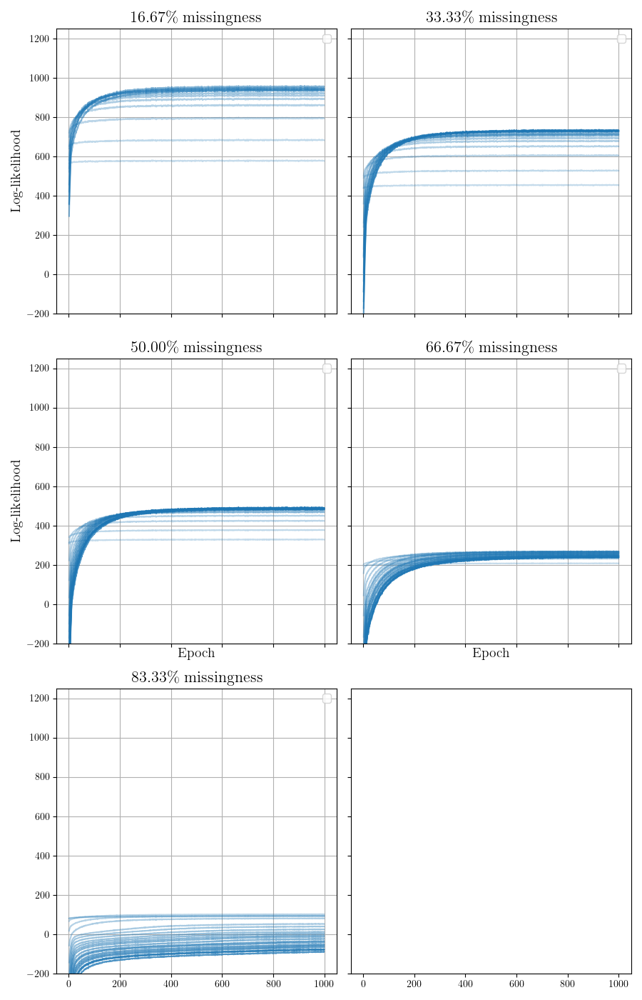

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [17]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
max_epoch = 0
for epochs in val_ckpts.values():
    max_e = max(epochs)
    max_epoch = max_e if max_e > max_epoch else max_epoch
main_color = (list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black'])[0]
main_color = mpl.colors.to_rgba(main_color)
exp_name = list(suite.keys())[0]
colors = []
for epoch in val_ckpts[exp_name]:
    c = list(main_color)
    c[-1] = (3/4)/(max_epoch) * epoch + 1/4
    colors.append(c)

for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250),
                    colors=colors)

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### MVAE

In [18]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                                     5000],
}

<IPython.core.display.Javascript object>


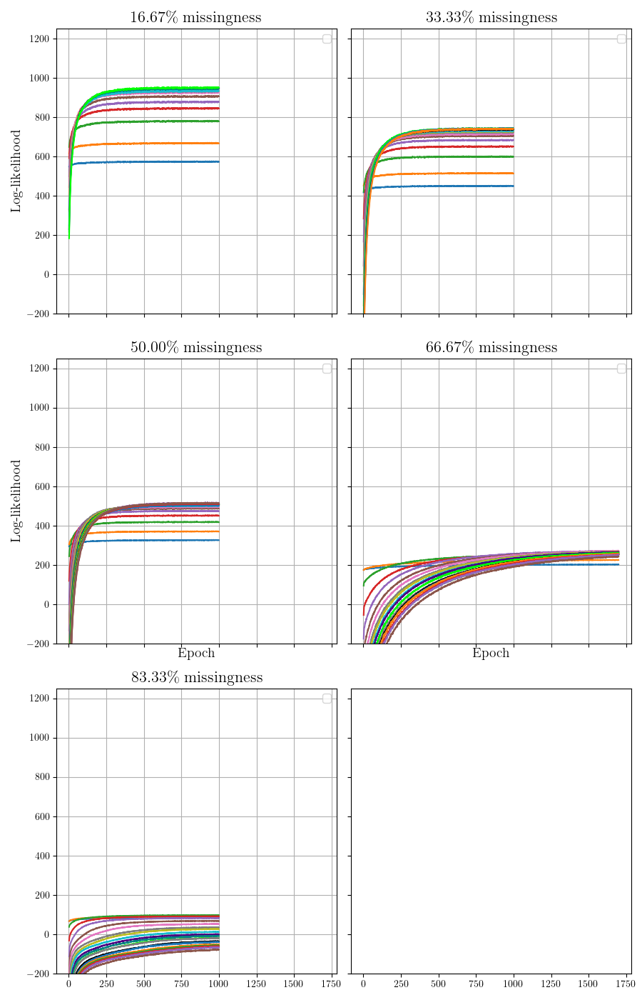

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [19]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### PVAE

In [20]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
    'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_noaggact_val_lr5e-5',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500,  4750,
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500,  4750,
                                                     5000],
}

<IPython.core.display.Javascript object>


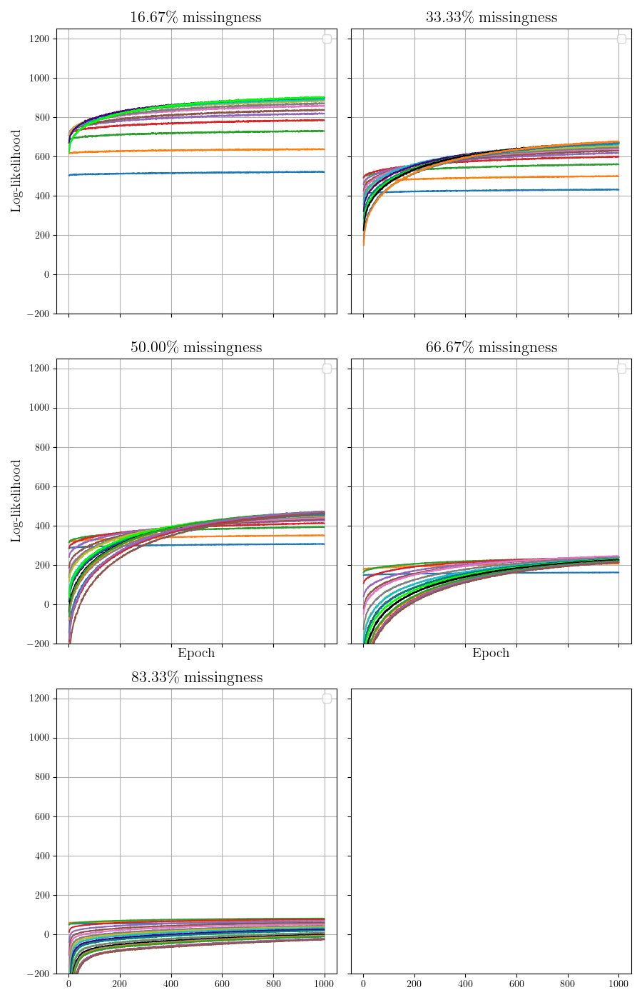

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [21]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### HIVAE

In [22]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
    'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                                     5000],
}

<IPython.core.display.Javascript object>


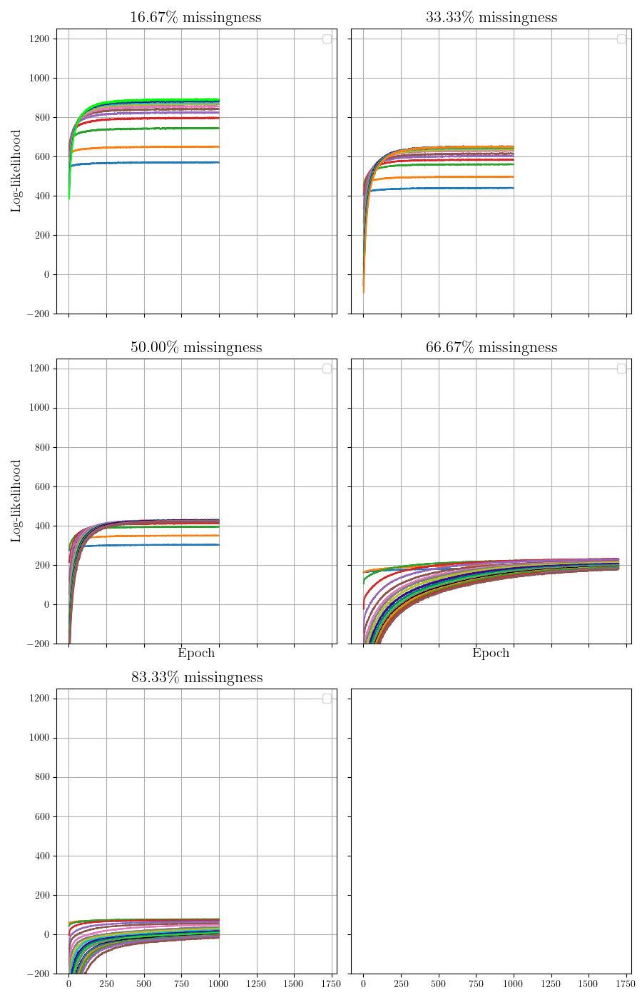

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [23]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI + pre-impute with Gibbs, reject outside min/max

In [24]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
#     'VAE (Complete)': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval',
    'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval_imprej',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_incomp_eval_imprej',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VCDI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VCDI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VCDI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


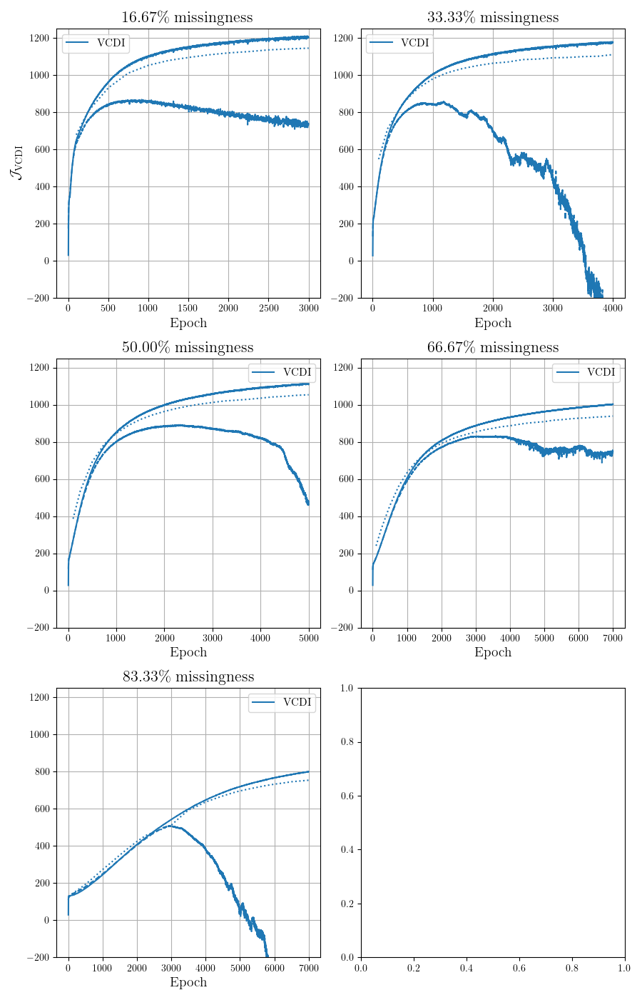

In [26]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik', 'aug_val_log_lik'),
#                     err_keys=(None, None, None),
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik'),
#                     err_keys=(None, None,),
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [28]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750,
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750,
                                                     5000],
}

<IPython.core.display.Javascript object>


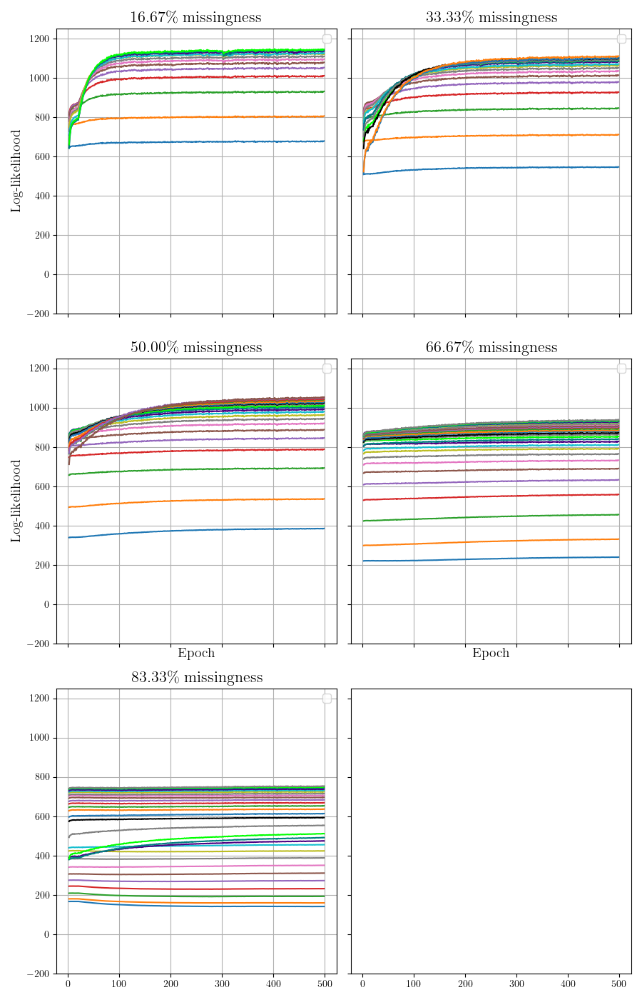

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [29]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VBGI + pre-impute with Gibbs

In [66]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
#     'VAE (Complete)': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval_imprej',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_incomp_eval_imprej',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
#     'VBGI-VAE-M': 'fcvae_mcimp_marginalise',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
#     'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VCDI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
#     'VCDI-VAE': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


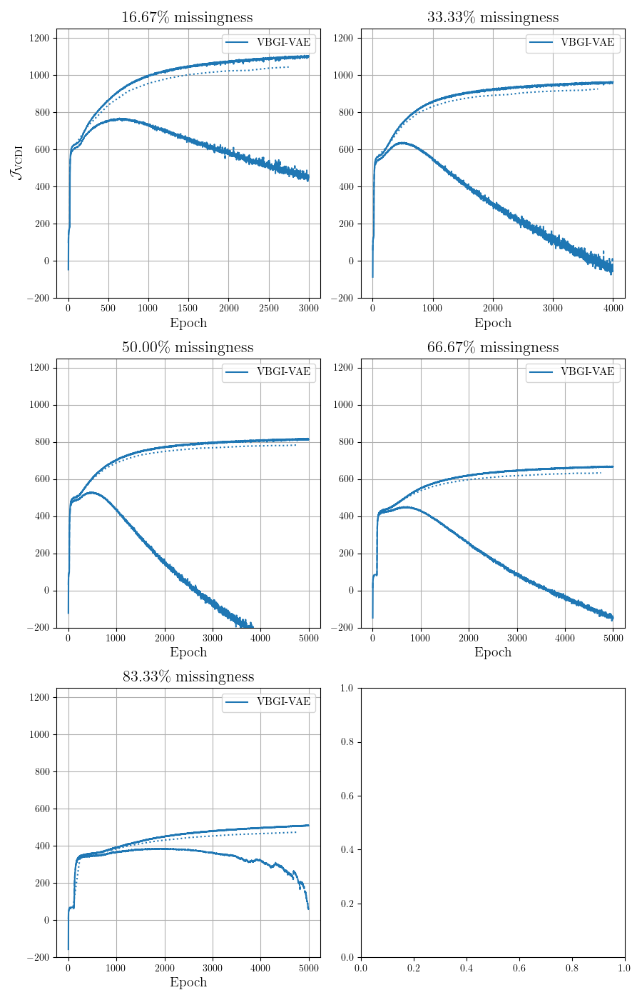

In [67]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik', 'aug_val_log_lik'),
#                     err_keys=(None, None, None),
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik'),
#                     err_keys=(None, None,),
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VBGI

In [70]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
#     'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750,
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 
#                                                      2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750,
#                                                      5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                3250, 3500, 3750, 4000, 4250, 4500, 4750,5000],
#     'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
#                 1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                 3250, 3500, 3750, 4000, 4250, 4500, 4750,5000],
}

<IPython.core.display.Javascript object>


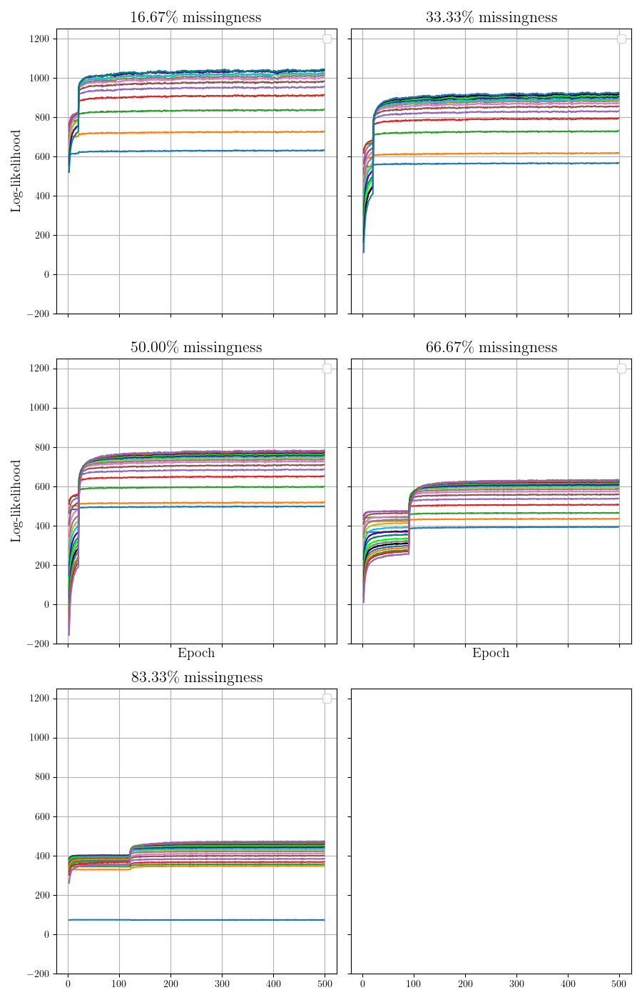

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [71]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VBGI-M + pre-impute with Gibbs

In [72]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
#     'VAE (Complete)': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval_imprej',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_incomp_eval_imprej',
#     'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
#     'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VCDI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
#     'VCDI-VAE': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


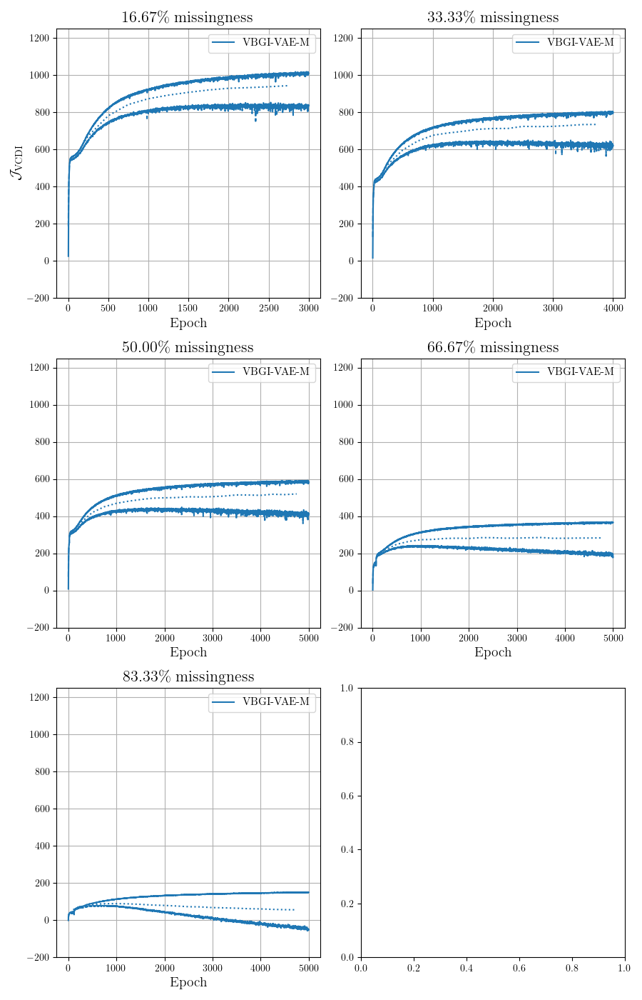

In [73]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik', 'aug_val_log_lik'),
#                     err_keys=(None, None, None),
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik'),
#                     err_keys=(None, None,),
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VBGI-M

In [76]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
#     'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750,
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 
#                                                      2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750,
#                                                      5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                3250, 3500, 3750, 4000, 4250, 4500, 4750,5000],
    'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
                1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                3250, 3500, 3750, 4000, 4250, 4500, 4750,5000],
}

<IPython.core.display.Javascript object>


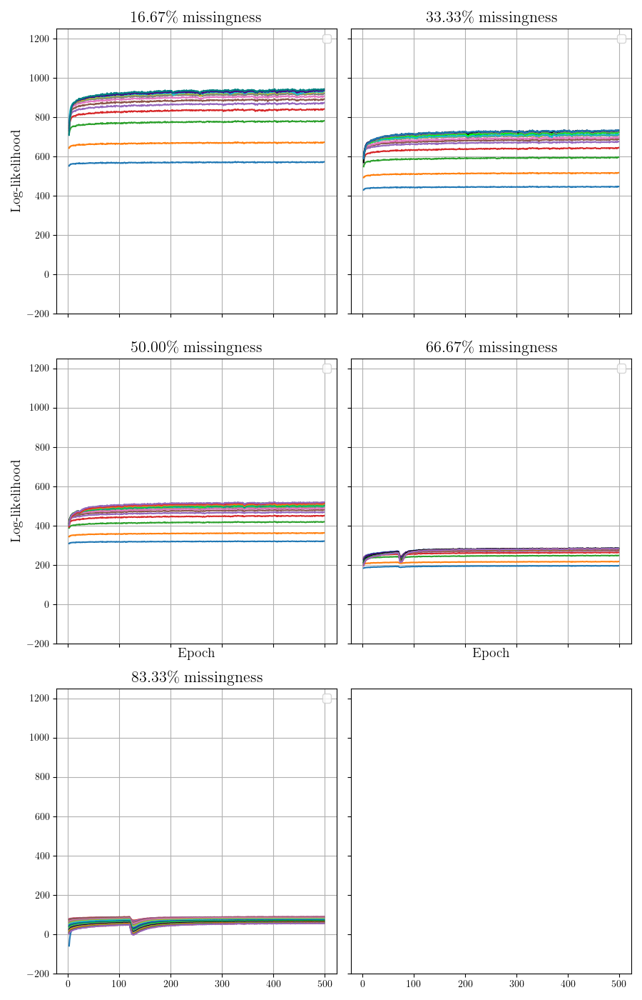

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [77]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI-VAE + pre-impute with Gibbs, clip to min/max

In [30]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
#     'VAE (Complete)': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_incomp_eval',
#     'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_incomp_eval_imprej',
    'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_incomp_eval_imprej',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VCDI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
    'VCDI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VCDI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VCDI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

<IPython.core.display.Javascript object>


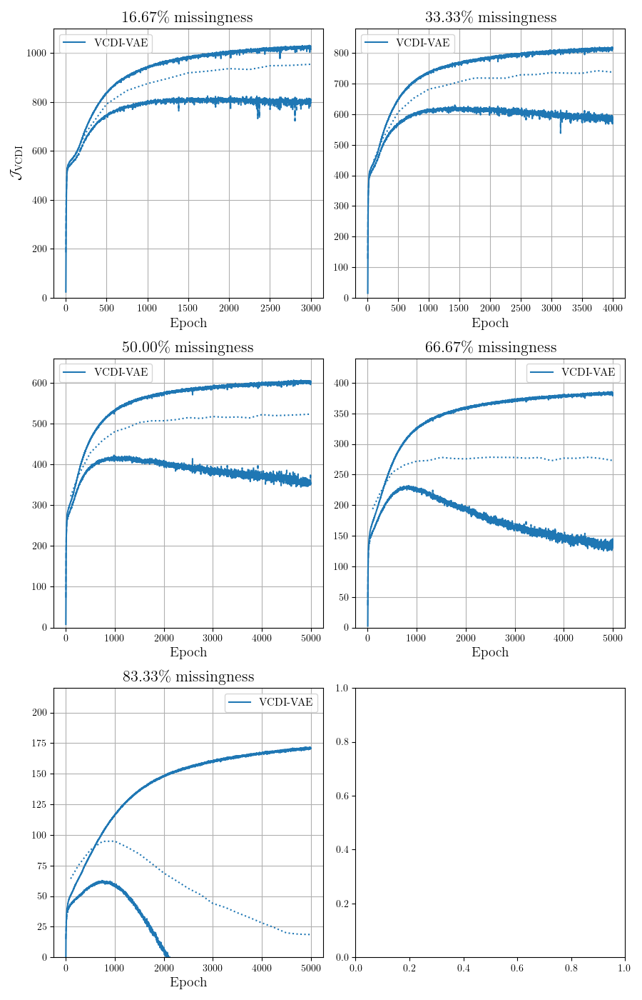

In [31]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1, 3]
# gs = [1]
ylims = [(0, 1100), (0, 880), (0, 660), (0,440), (0, 220)]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik', 'aug_val_log_lik'),
#                     err_keys=(None, None, None),
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
#                     ylim=(-200, 1250),
                    ylim=ylims[i])

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, ):
        ylabel = '$\mathcal{J}_{\mathrm{VCDI}}$'
    else:
        ylabel=None

    xlabel='Epoch'
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
#                     y_metric_keys=('train_log_lik', 'val_log_lik'),
#                     err_keys=(None, None,),
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
#                     ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI-VAE

In [32]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbsrej',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 
                                                     5000],
}

<IPython.core.display.Javascript object>


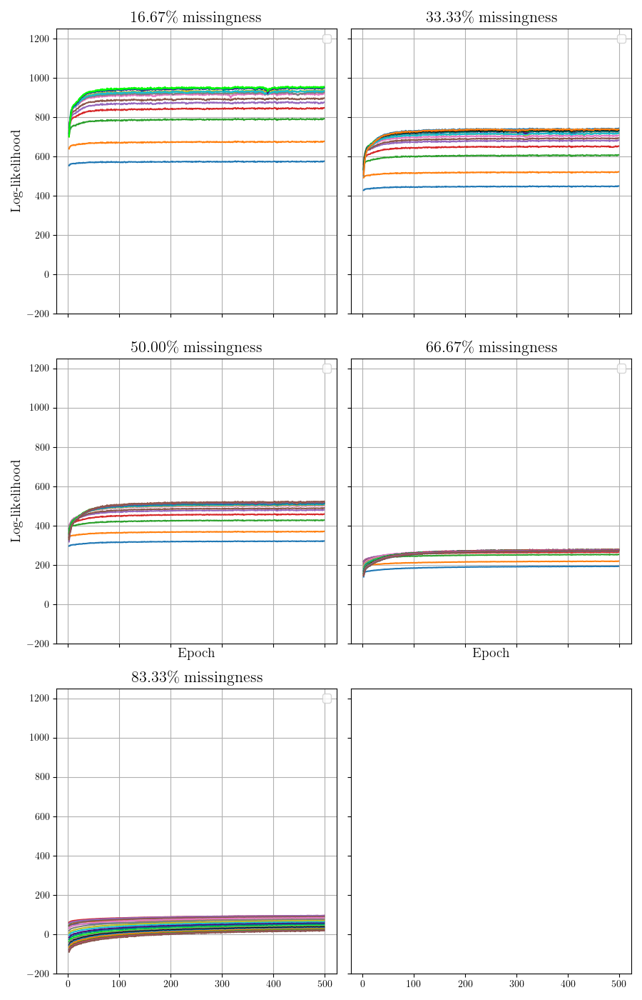

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [33]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, sharey=True, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### All-in-one figure (train-val-fine\_val)

In [58]:
vae_suite = {
    'MVAE': 'fc_mvae',
    'HI-VAE': 'fc_hivae',
#     'PartialVAE+': 'fc_pvae',
    'PartialVAE+': 'fc_pvae_noaggact',
    'MIWAE': 'fc_miwae',
}

vae_suite_val = {
    'MVAE': 'fc_mvae_val',
    'HI-VAE': 'fc_hivae_val',
#     'PartialVAE+': 'fc_pvae_val',
    'PartialVAE+': 'fc_pvae_noaggact_val_lr5e-5',
    'MIWAE': 'fc_miwae_val',
}

val_ckpts = {
    'MIWAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VGI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
#     'VGI-VAE': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

vcdim_suite = {
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise',
}

vcdim_suite_val = {
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
}

vcdivae_suite = {
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
}

vcdivae_suite_val = {
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
}


vcdi_suite = {
    'VGI': 'fcvae_pretrained_svar_cdi_const_incomp_eval_imprej',
}

vcdi_suite_val = {
    'VGI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
}


<IPython.core.display.Javascript object>


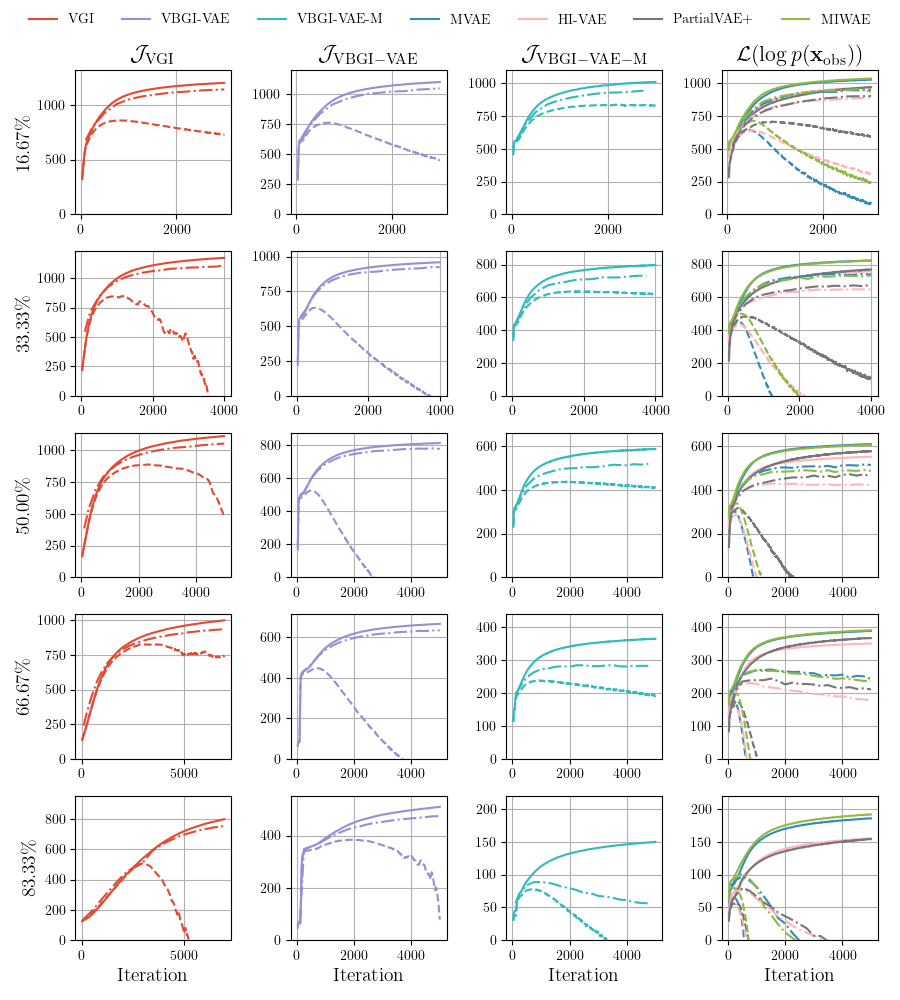

In [60]:
fig, axes = plt.subplots(nrows=5, ncols=4, sharex=False, sharey=False, figsize=(9, 10))
# axes = axes.flatten()

gs = [1,2,3,4,5]

#
# VAE
#

ylims = [(0, 1320), (0, 1228), (0, 1136), (0, 1044), (0, 952)]
col = 0
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=vcdi_suite, seed=exp_seed_keys[0], filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    window_size = 30
    for method in stats.keys():
        for metric in ('train_log_lik', 'aug_val_log_lik'):
            stats[method][metric] = ma(stats[method][metric], ws=window_size)
        stats[method]['curr_epoch'] = stats[method]['curr_epoch'][window_size-1:]
    
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{J}_{\mathrm{VGI}}$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    colors=[colors[1]],
                    ylim=ylims[i],
                    legend=False
                   )


for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=vcdi_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    ylabel = f'{g/6*100:.2f}\%'
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    colors=[colors[1]],
                    no_label=True,
                    styles=['-.', ':',  ],
                    legend=False)

    axes[i][col].grid()



#
# VBGI-VAE
#


ylims = [(0, 1200), (0, 1038), (0, 876), (0, 714), (0, 552)]
col = 1
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=vcdivae_suite, seed=exp_seed_keys[0], filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    window_size = 30
    for method in stats.keys():
        for metric in ('train_log_lik', 'aug_val_log_lik'):
            stats[method][metric] = ma(stats[method][metric], ws=window_size)
        stats[method]['curr_epoch'] = stats[method]['curr_epoch'][window_size-1:]
    
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{J}_{\mathrm{VBGI-VAE}}$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    colors=[colors[2]],
                    ylim=ylims[i],
                    legend=False
                   )


for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=vcdivae_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    colors=[colors[2]],
                    no_label=True,
                    styles=['-.', ':',  ],
                    legend=False)

    axes[i][col].grid()

    
#
# VBGI-VAE-M
#


ylims = [(0, 1100), (0, 880), (0, 660), (0, 440), (0, 220)]
col = 2
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=vcdim_suite, seed=exp_seed_keys[0], filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    window_size = 30
    for method in stats.keys():
        for metric in ('train_log_lik', 'aug_val_log_lik'):
            stats[method][metric] = ma(stats[method][metric], ws=window_size)
        stats[method]['curr_epoch'] = stats[method]['curr_epoch'][window_size-1:]
    
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{J}_{\mathrm{VBGI-VAE-M}}$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'aug_val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    colors=[colors[3]],
                    ylim=ylims[i],
                    legend=False
                   )


for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=vcdim_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
            stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    colors=[colors[3]],
                    no_label=True,
                    styles=['-.', ':',  ],
                    legend=False)

    axes[i][col].grid()
    
#
# VAEs
#


ylims = [(0, 1100), (0, 880), (0, 660), (0, 440), (0, 220)]
col = 3
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=vae_suite, seed=exp_seed_keys[0], filename='summary.csv')

    window_size = 30
    for method in stats.keys():
        for metric in ('train_log_lik', 'val_log_lik'):
            stats[method][metric] = ma(stats[method][metric], ws=window_size)
        stats[method]['curr_epoch'] = stats[method]['curr_epoch'][window_size-1:]
    
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=ylims[i],
                    legend=False,
                    colors=colors[5:]
                   )
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{L}(\log p(\mathbf{x}_{\mathrm{obs}}))$', fontdict={'fontsize': 16})

for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=vae_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

#     ylabel = f'{g/6*100:.2f}\%'
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel,
                    colors=colors[5:],
                    no_label=True,
                    styles=['-.', ':',  ],
                    legend=False)

    axes[i][col].grid()

    
fig.tight_layout(rect=(0, 0, 1, 0.97))

handles0, labels0 = axes[0][0].get_legend_handles_labels()
handles1, labels1 = axes[0][1].get_legend_handles_labels()
handles2, labels2 = axes[0][2].get_legend_handles_labels()
handles3, labels3 = axes[0][3].get_legend_handles_labels()
handles = handles0 + handles1 + handles2 + handles3
labels = labels0 + labels1 + labels2 + labels3

axes[0][0].legend(handles=handles, labels=labels,
                  ncol=7, bbox_to_anchor=(0.5, 0.98), bbox_transform=fig.transFigure, loc='center', 
                  frameon=False)

In [61]:
# fig.savefig('figures/fcvae_frey_all_learning_curves.pdf', bbox_inches='tight')

###### .

##### All-in-one-figure (val refitting curves)

In [10]:
vae_suite_val = {
#     'MIWAE': 'fc_miwae_val',
    'MVAE': 'fc_mvae_val',
#     'PartialVAE+': 'fc_pvae_val',
#     'PartialVAE+': 'fc_pvae_noaggact_val_lr5e-5',
#     'HI-VAE': 'fc_hivae_val',
}

val_ckpts = {
    'MIWAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'MVAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'PartialVAE+': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'HI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VGI': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
#     'VGI-VAE': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
    'VBGI-VAE-M': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 4750, 5000],
}

vcdim_suite_val = {
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise_val',
}

vcdivae_suite_val = {
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1_val',
}

vcdi_suite_val = {
    'VGI': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbsrej',
}


<IPython.core.display.Javascript object>


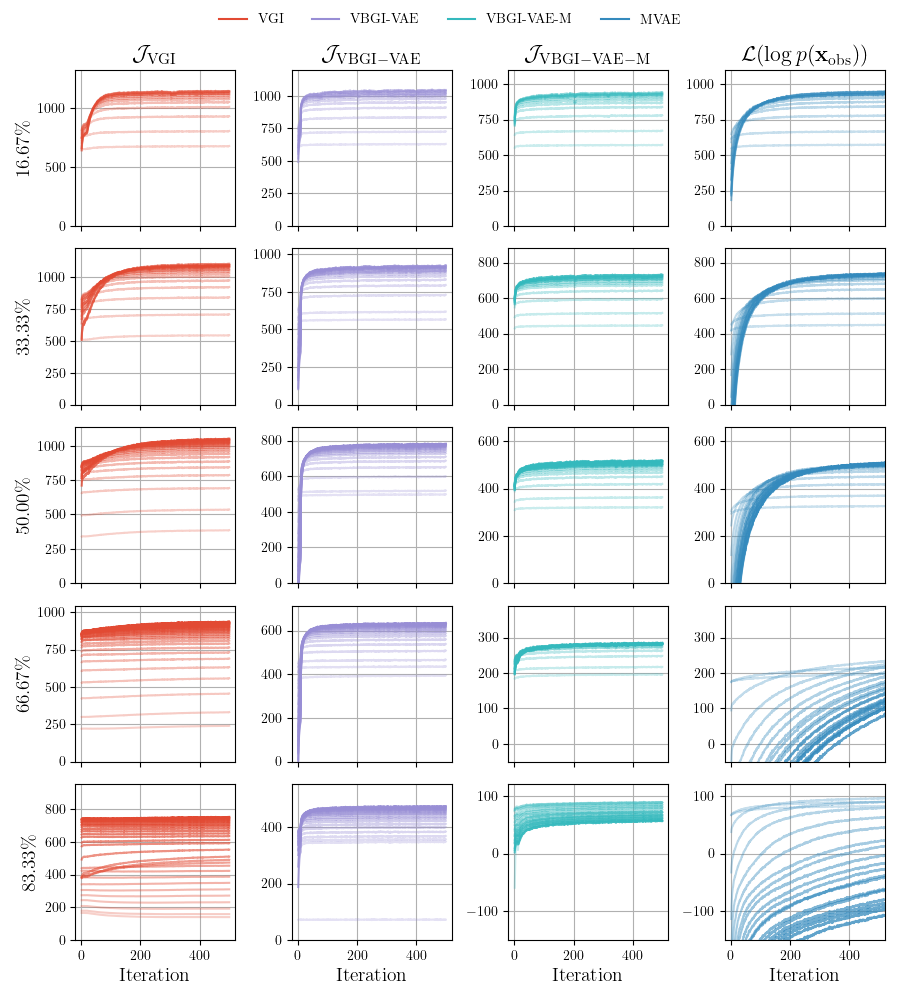

In [12]:
fig, axes = plt.subplots(nrows=5, ncols=4, sharex=True, sharey=False, figsize=(9, 10))
# axes = axes.flatten()

gs = [1,2,3,4,5]

max_epoch = 0
for epochs in val_ckpts.values():
    max_e = max(epochs)
    max_epoch = max_e if max_e > max_epoch else max_epoch

all_colors = list(colors)
#
# VAEs
#


ylims = [(0, 1100), (0, 880), (0, 660), (-50, 390), (-150, 120)]
col = 3

main_color1 = all_colors[5]
main_color1 = mpl.colors.to_rgba(main_color1)
exp_name = list(vae_suite_val.keys())[0]
colors1 = []
for epoch in val_ckpts[exp_name]:
    c = list(main_color1)
    c[-1] = (3/4)/(max_epoch) * epoch + 1/4
    colors1.append(c)

for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=vae_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')
    
    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
#             stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
#     ylabel = f'{g/6*100:.2f}\%'
    ylabel = None
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{L}(\log p(\mathbf{x}_{\mathrm{obs}}))$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=ylims[i],
                    colors=colors1,
                    legend=False)

    axes[i][col].set_xlim(left=-20, right=520)

#
# VBGI-VAE-M
#


ylims = [(0, 1100), (0, 880), (0, 660), (-50, 390), (-150, 120)]
col = 2
ylabel=None

main_color4 = all_colors[3]
main_color4 = mpl.colors.to_rgba(main_color4)
exp_name = list(vcdivae_suite_val.keys())[0]
colors1 = []
for epoch in val_ckpts[exp_name]:
    c = list(main_color4)
    c[-1] = (3/4)/(max_epoch) * epoch + 1/4
    colors1.append(c)

for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=vcdim_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')
    
    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
#             stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{J}_{\mathrm{VBGI-VAE-M}}$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=ylims[i],
                    colors=colors1,
                    legend=False)
    
#
# VBGI-VAE
#


ylims = [(0, 1200), (0, 1038), (0, 876), (0, 714), (0, 552)]
col = 1
ylabel=None

main_color2 = all_colors[2]
main_color2 = mpl.colors.to_rgba(main_color2)
exp_name = list(vcdivae_suite_val.keys())[0]
colors1 = []
for epoch in val_ckpts[exp_name]:
    c = list(main_color2)
    c[-1] = (3/4)/(max_epoch) * epoch + 1/4
    colors1.append(c)

for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=vcdivae_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')
    
    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
#             stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{J}_{\mathrm{VBGI-VAE}}$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=ylims[i],
                    colors=colors1,
                    legend=False)

#
# VGI
#

ylims = [(0, 1320), (0, 1228), (0, 1136), (0, 1044), (0, 952)]

col = 0
ylabel=None

main_color3 = all_colors[1]
main_color3 = mpl.colors.to_rgba(main_color3)
exp_name = list(vcdi_suite_val.keys())[0]
colors1 = []
for epoch in val_ckpts[exp_name]:
    c = list(main_color3)
    c[-1] = (3/4)/(max_epoch) * epoch + 1/4
    colors1.append(c)

for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=vcdi_suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')
    
    for exp, stat in stats.items():
        if 'VGI' in exp:
            stat['train_log_lik'] = np.array(stat['train_log_lik']) + np.array(stat['train_entropy'])
#             stat['aug_val_log_lik'] = np.array(stat['aug_val_log_lik']) + np.array(stat['aug_val_entropy'])
    
    ylabel = f'{g/6*100:.2f}\%'
    xlabel = None
    if i == 4:
        xlabel = 'Iteration'
    
    if i == 0:
        axes[i][col].set_title(label='$\mathcal{J}_{\mathrm{VGI}}$', fontdict={'fontsize': 16})
    
    plot_comparison(axes[i][col], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=ylims[i],
                    colors=colors1,
                    legend=False)


fig.tight_layout(rect=(0, 0, 1, 0.97))

handles = [
    mpl.lines.Line2D([0], [0], color=main_color3),
    mpl.lines.Line2D([0], [0], color=main_color2),
    mpl.lines.Line2D([0], [0], color=main_color4),
    mpl.lines.Line2D([0], [0], color=main_color1),
]
labels = list(vcdi_suite_val.keys()) + list(vcdivae_suite_val.keys()) + list(vcdim_suite_val.keys()) + list(vae_suite_val.keys())

axes[0][0].legend(handles=handles, labels=labels,
                  ncol=7, bbox_to_anchor=(0.5, 0.98), bbox_transform=fig.transFigure, loc='center', 
                  frameon=False)

In [13]:
# fig.savefig('figures/fcvae_frey_finetuning_curves.pdf', bbox_inches='tight')

##### Test refitting curves

In [78]:
suite = {
    'VAE Complete data': 'refit_fcvae_complete_data',
#     'MICE + MLE': 'refit_fcvae_mice_baseline',
#     'MIWAE': 'refit_fc_miwae',
    'MVAE': 'refit_fc_mvae',
#     'HI-VAE': 'refit_fc_hivae',
#     'PartialVAE+': 'refit_fc_pvae_noaggact',
    'VCDI': 'refit_fcvae_pretrained_svar_cdi_const',
#     'VCDI-VAE': 'refit_fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'MCVAE': 'refit_fcvae_mcimp',
#     'MCVAE detach': 'refit_fcvae_mcimp_detach',
    'VBGI-VAE': 'refit_fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
    'VBGI-VAE-M': 'refit_fcvae_mcimp_marginalise',
}

<IPython.core.display.Javascript object>


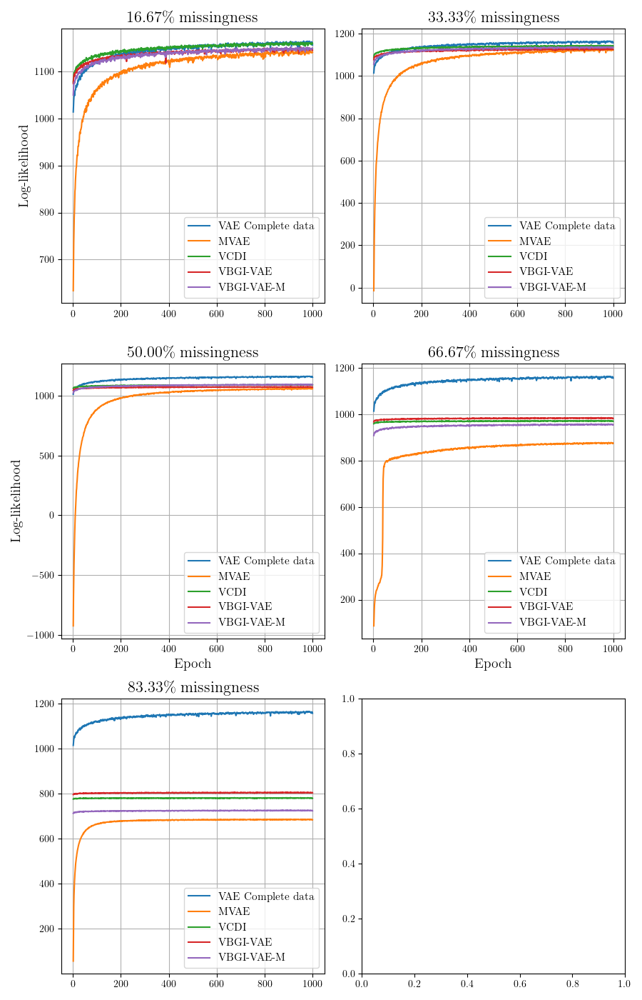

In [79]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=False, sharey=False, figsize=(9, 14))
axes = axes.flatten()
# axes = [axes]
gs = [1, 2, 3, 4, 5]
# gs = [5]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
#                     y_metric_keys=('val_log_lik',),  
# #                     y_metric_keys=('train_log_lik', 'train_entropy', 'val_log_lik'),
                    err_keys=(None,),
#                     err_keys=(None, None),
#                     err_keys=(None, None, None, None),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=None)
#                     ylim=(-19.6, -19.1))
#                     ylim=(0, 10))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

### Other likelihood analyses

##### VAE-based methods, reset encoder

In [99]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
    'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
    'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val_resetenc',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val_resetenc',
    'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
    'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

In [100]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

<IPython.core.display.Javascript object>

###### MIWAE

In [66]:
suite = {
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val_resetenc',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val_resetenc',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val_resetenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


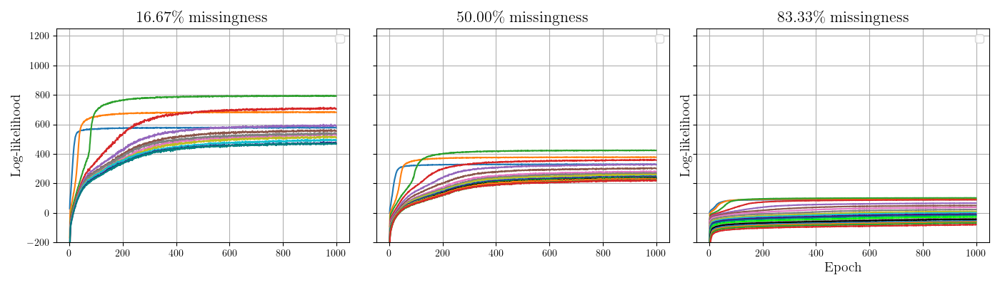

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [67]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### MVAE

In [68]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val_resetenc',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val_resetenc',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val_resetenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


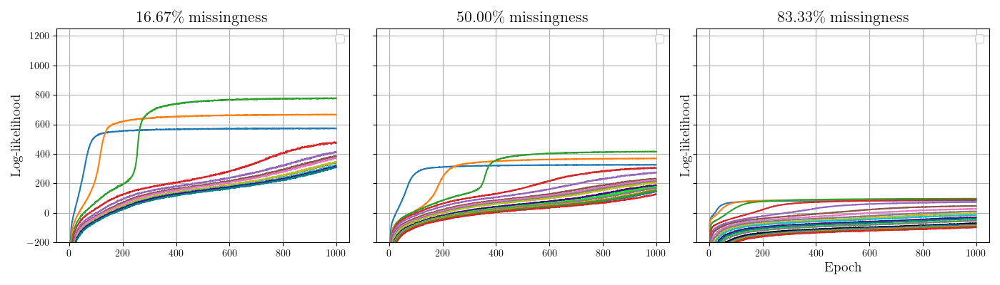

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [69]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### HIVAE

In [70]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val_resetenc',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val_resetenc',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
    'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val_resetenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


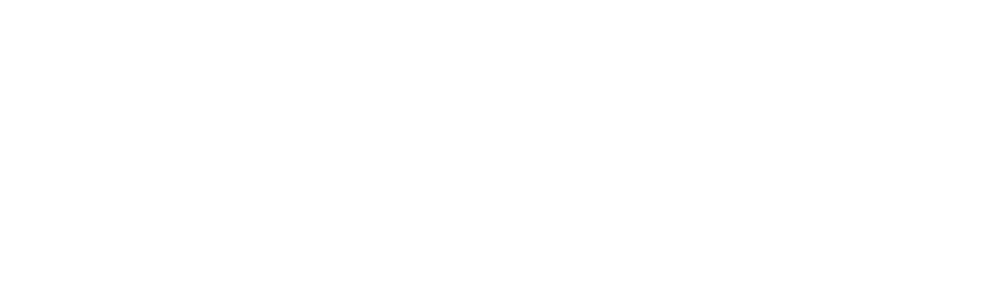

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [73]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-700, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VAE-based methods + lrelu, reset encoder

In [82]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_lrelu',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_lrelu',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_lrelu_val_resetenc',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_lrelu_val_resetenc',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


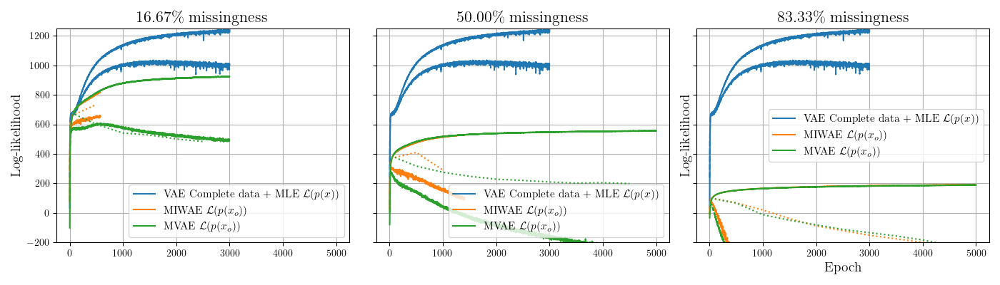

In [83]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', ),
                    err_keys=(None, ),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### MIWAE

In [85]:
suite = {
    'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_lrelu_val_resetenc',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_lrelu_val_resetenc',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val_resetenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


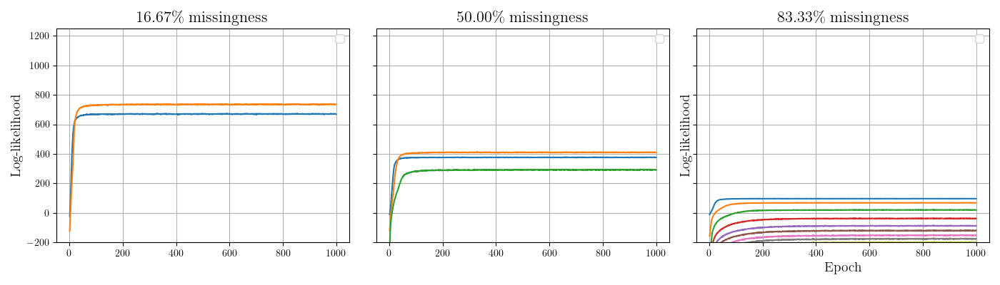

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [86]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### MVAE

In [87]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_lrelu_val_resetenc',
    'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_lrelu_val_resetenc',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val_resetenc',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val_resetenc',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': 'fcvae_pretrained_svar_cdi_const_val_resetenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5 const': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


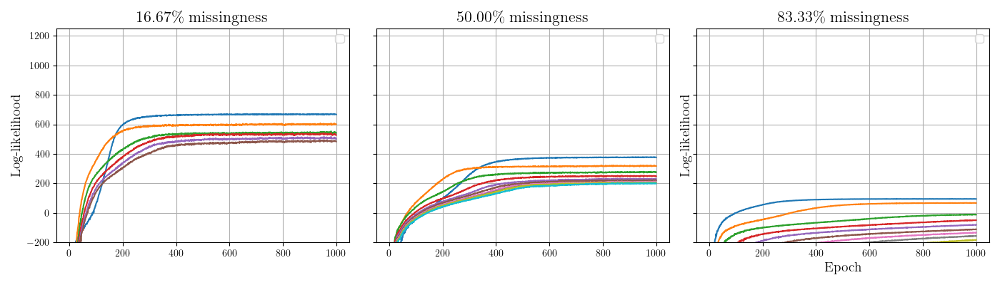

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [88]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI (default hparams)

In [18]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
# #     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
# #     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


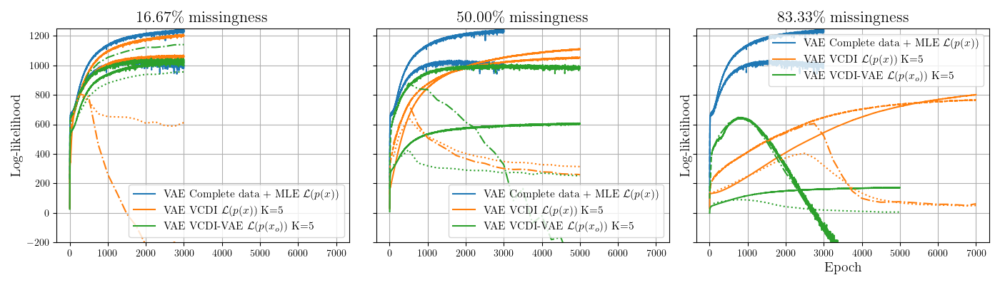

In [19]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [20]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


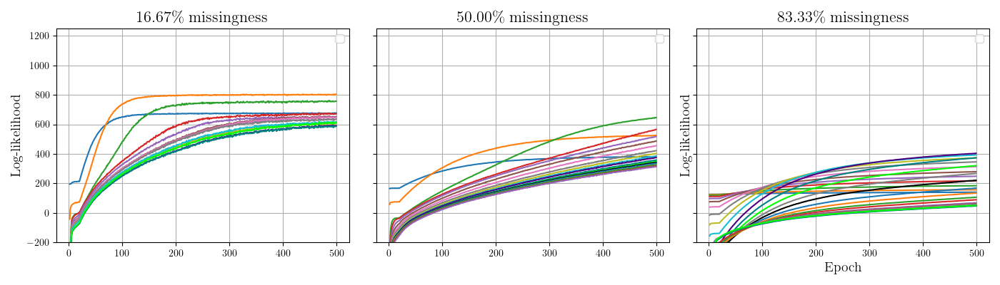

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [21]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [22]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


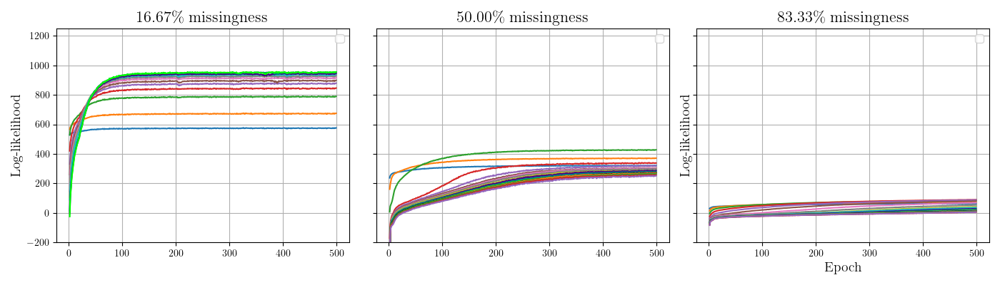

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [23]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI (default hparams) - refit for more epochs

In [24]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_epochs',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_epochs',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


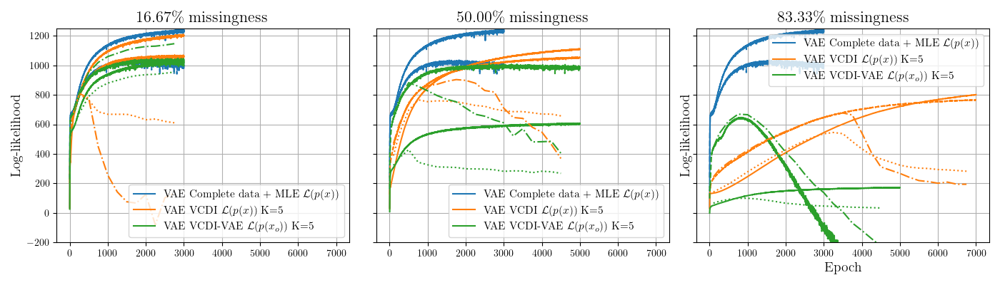

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [93]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_epochs',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_epochs',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


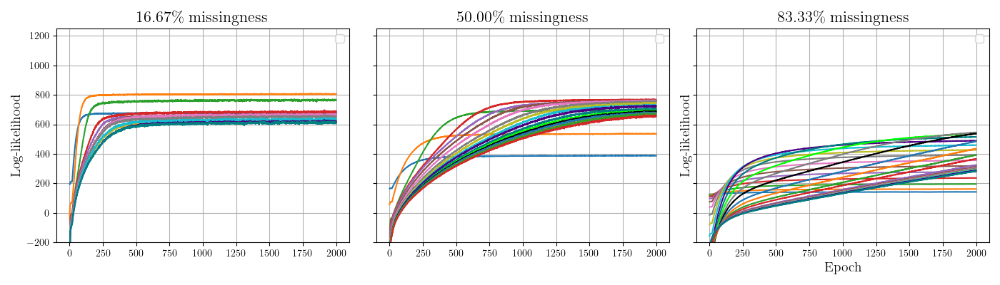

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [94]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [28]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_epochs',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_epochs',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


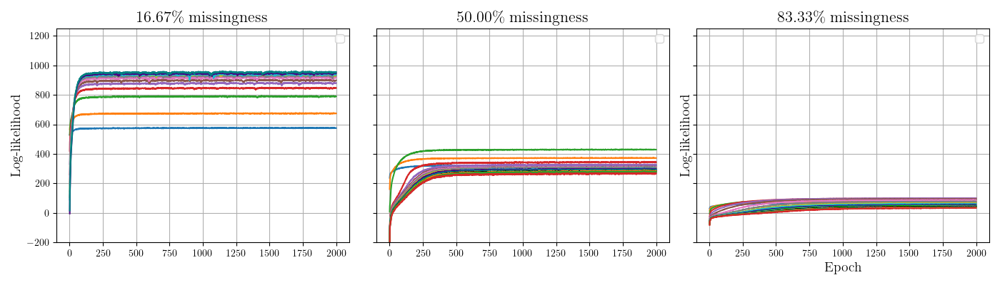

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [29]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

In [229]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


##### VCDI freeze encoder

In [30]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_fixenc',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_fixenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


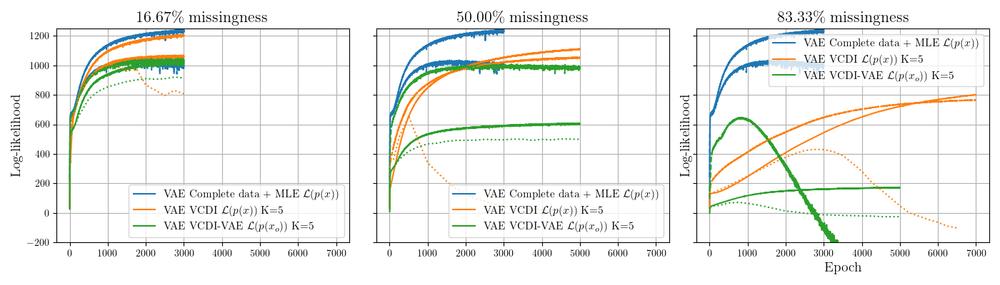

In [31]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [32]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_fixenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_fixenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


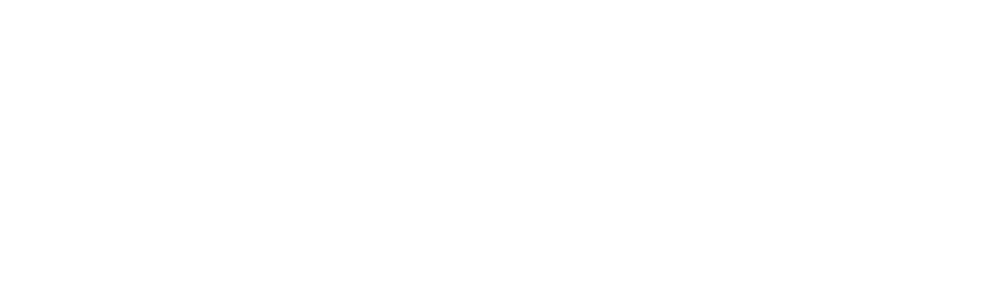

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [221]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>


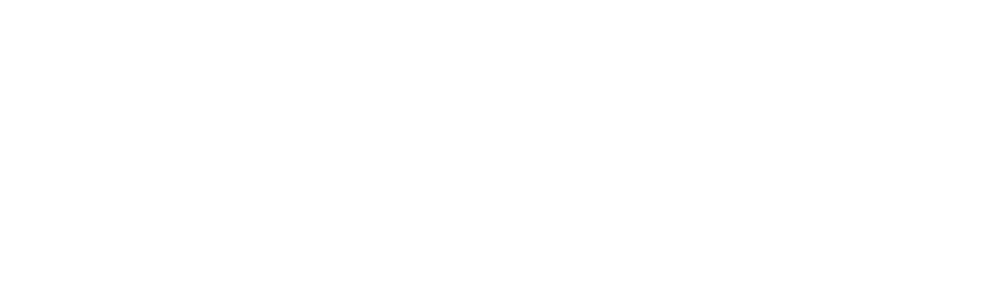

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [33]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [34]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_fixenc',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_fixenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


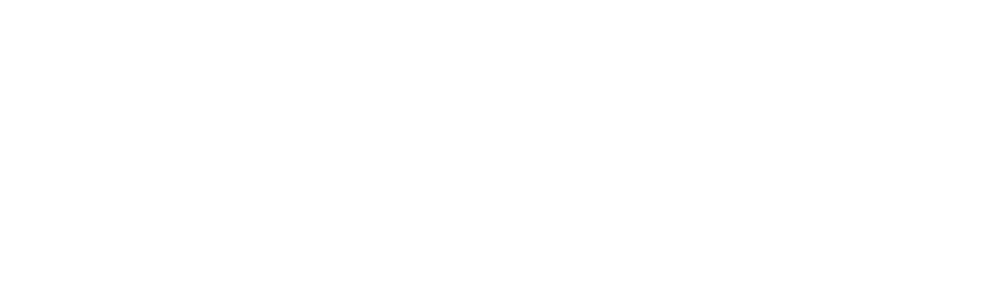

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [35]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI freeze encoder + imputation delay

In [36]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_fixenc_impdelay',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_fixenc_impdelay',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


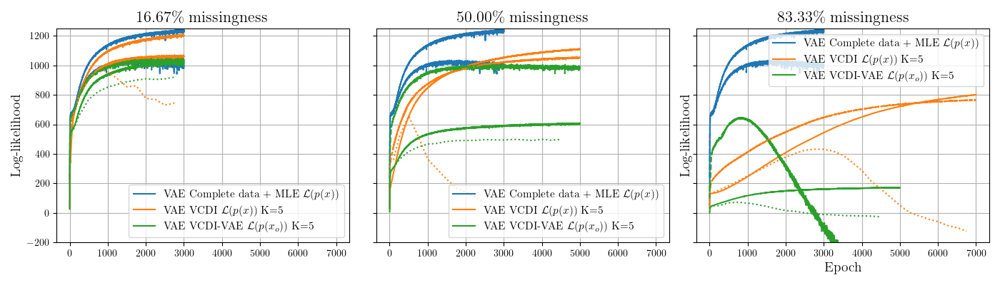

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [38]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_fixenc_impdelay',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_fixenc_impdelay',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


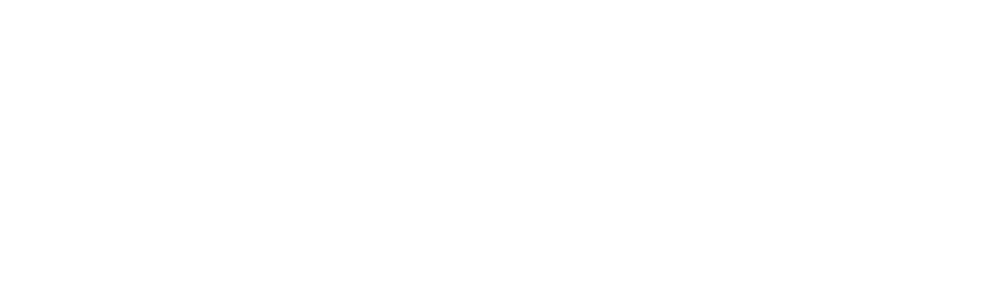

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [39]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [40]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_fixenc_impdelay',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_fixenc_impdelay',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


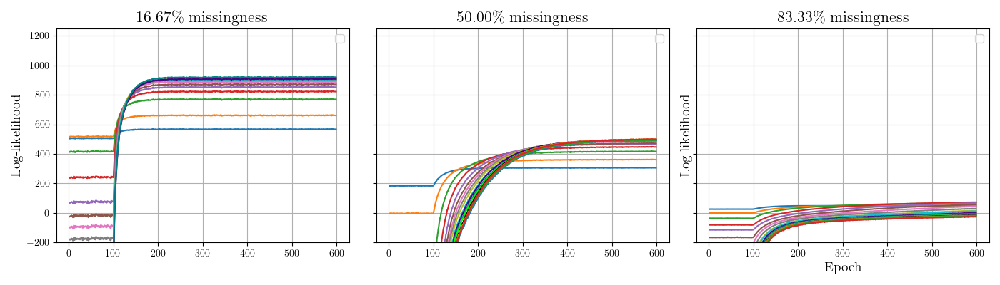

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [41]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI refit encoder with amsgrad

In [42]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_encamsgrad',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_encamsgrad',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


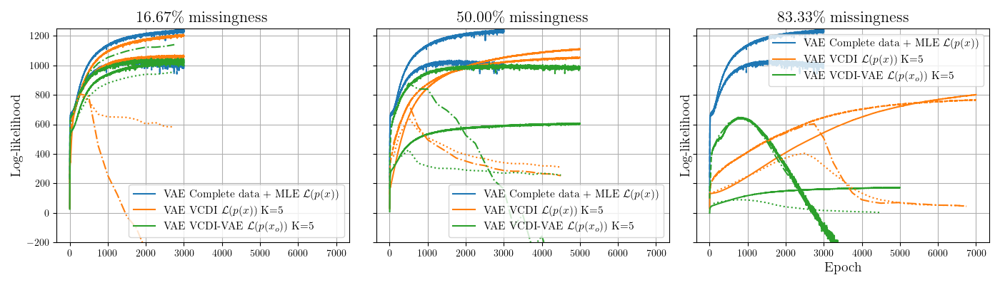

In [43]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

No improvement here over adam.

##### VCDI imputation delay

In [44]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_impdelay',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_impdelay',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


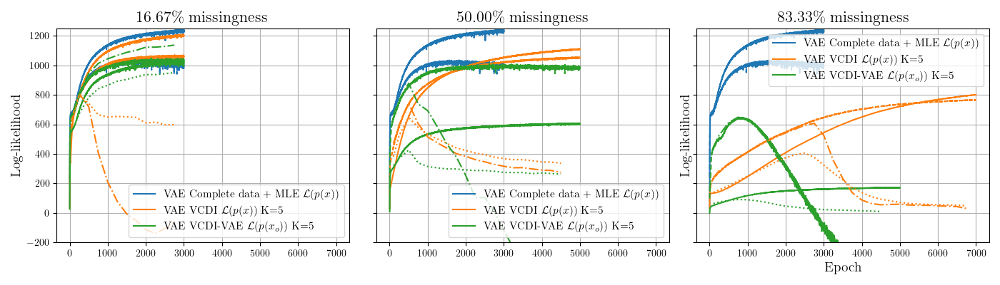

In [45]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

No improvement here.

###### VCDI

In [46]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_impdelay',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_impdelay',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


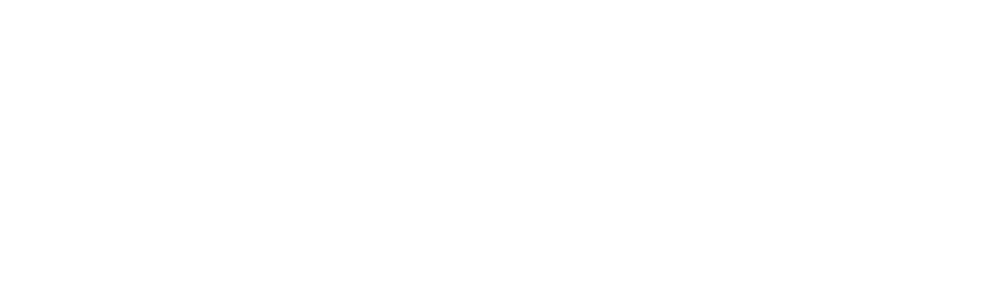

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [47]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [48]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_impdelay',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_impdelay',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


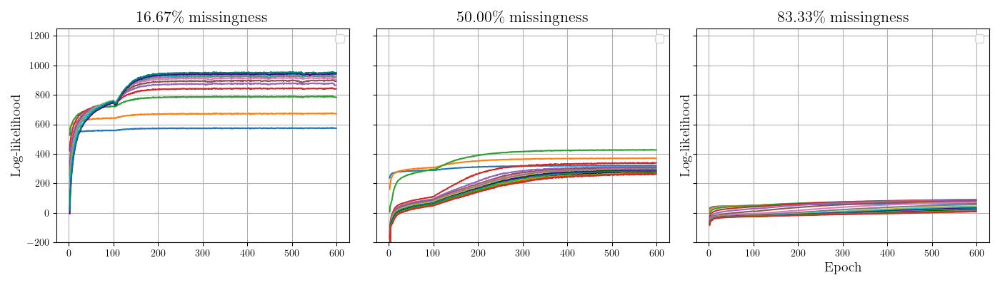

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [49]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI reset var. conditonal model weights + reset vae encoder weights

In [52]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_resetvar_resetenc',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetvar_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<ipython-input-53-752aa4d753ca>:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))


<IPython.core.display.Javascript object>


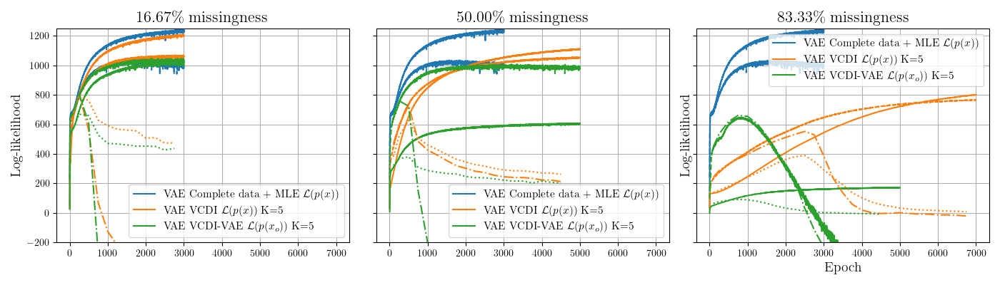

In [53]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [54]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_resetvar_resetenc',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetvar_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


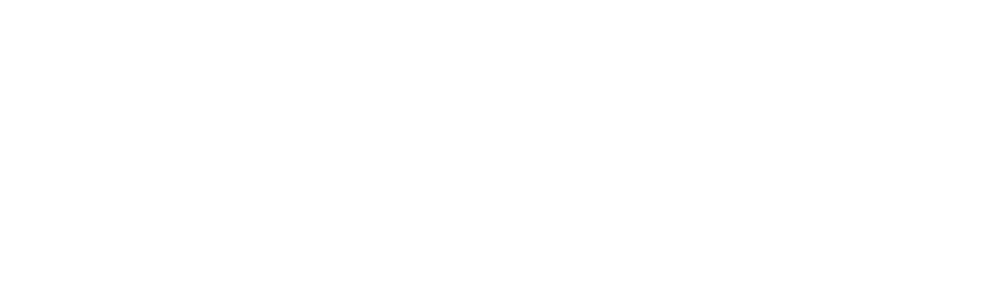

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [55]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [56]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_resetvar_resetenc',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_resetvar_resetenc',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


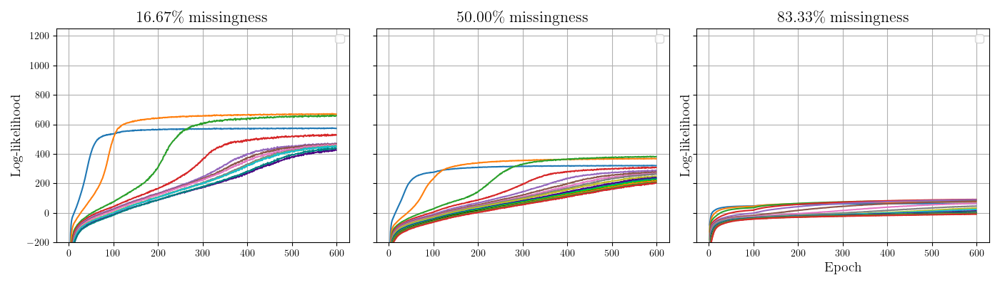

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [57]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI imputation acceptance

In [58]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_impacp',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_impacp',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


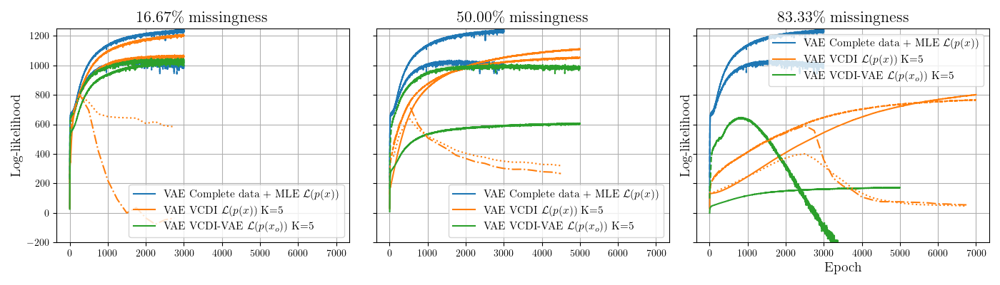

In [59]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [60]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_impacp',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_impacp',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


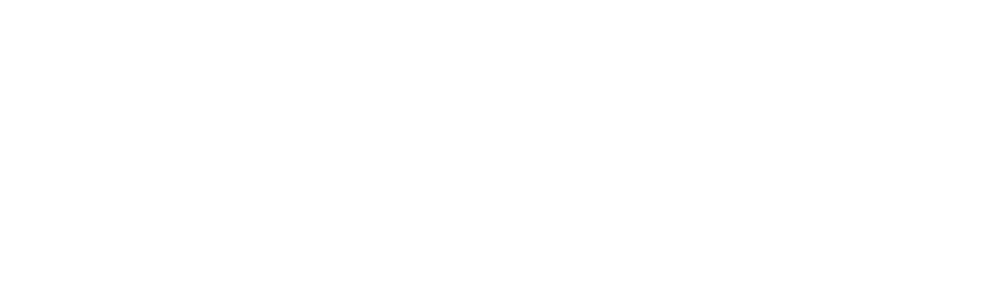

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [61]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI freeze encoder

In [74]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_gibbs1',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_gibbs1',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


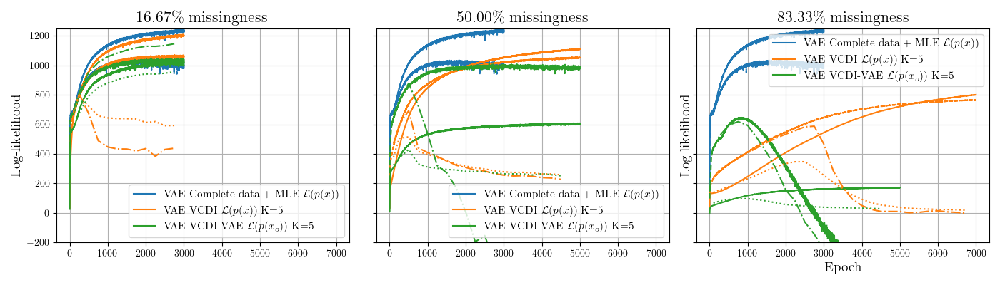

In [75]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [76]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_gibbs1',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_gibbs1',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


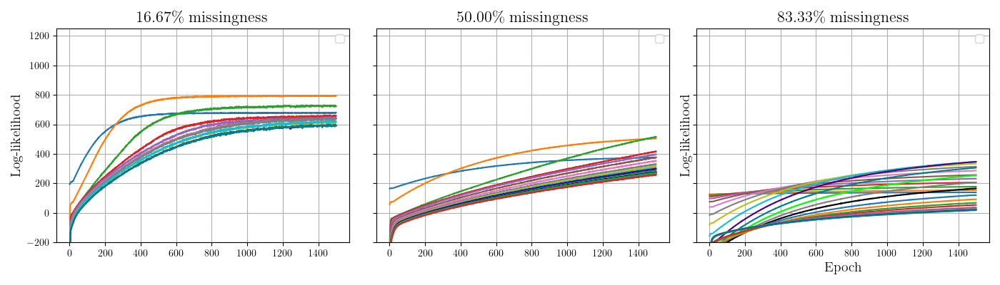

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [77]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

###### VCDI-VAE

In [78]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_gibbs1',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_gibbs1',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


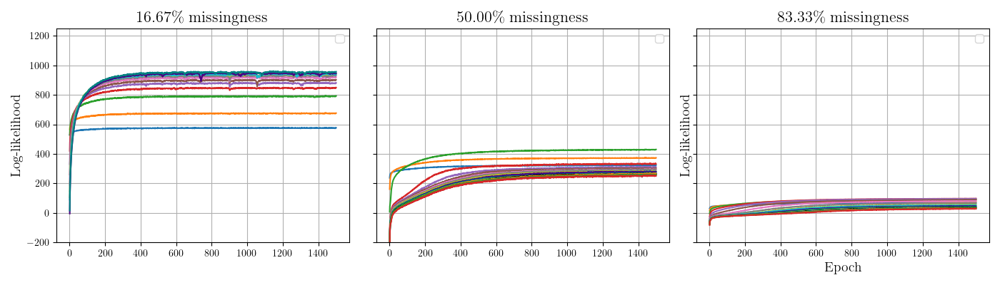

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [79]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI + lrelu

In [89]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_lrelu',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_lrelu_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_gibbs1',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

<IPython.core.display.Javascript object>


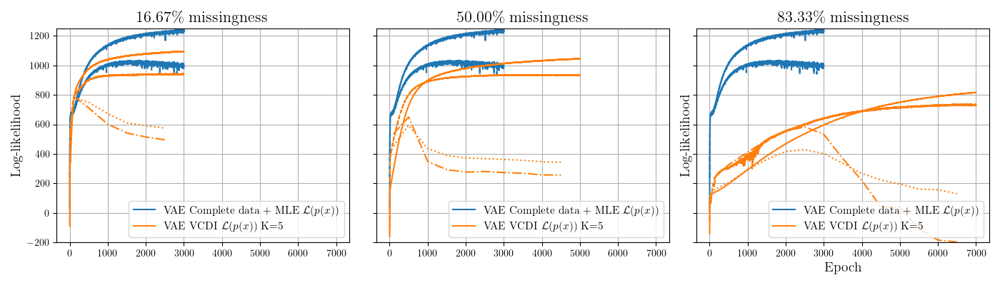

In [90]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

###### VCDI

In [91]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_lrelu_val',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_lrelu_val',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


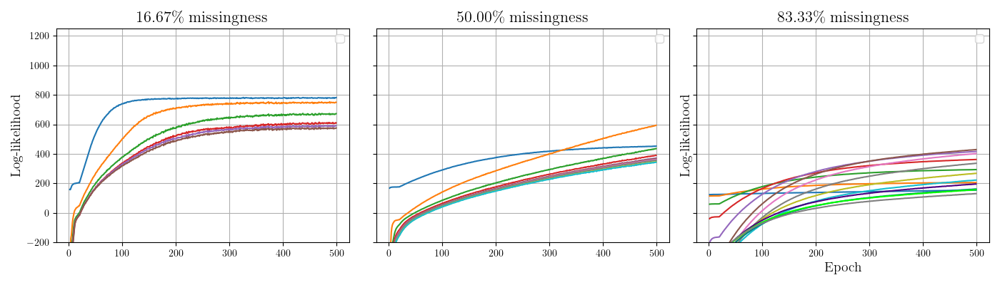

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [92]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

##### VCDI using true data + no imp

In [9]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_truedata_noimp',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_truedata_noimp',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

In [10]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

<IPython.core.display.Javascript object>

###### VCDI

In [11]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_truedata_noimp',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_truedata_noimp',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

In [12]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


###### VCDI-VAE

In [13]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_truedata_noimp',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_truedata_noimp',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

In [14]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


##### VCDI using true data

In [15]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_truedata',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_truedata',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

In [16]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

<IPython.core.display.Javascript object>

###### VCDI

In [17]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_truedata',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_truedata',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

In [18]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


###### VCDI-VAE

In [19]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_truedata',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_truedata',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

In [20]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


##### VCDI + pre-impute with Gibbs 

In [23]:
suite = {
#     'Complete MLE (Fitted on original data)': '../../../frey_faces_processed/fcvae_for_synthetic_data/1/fcvae_complete_data',
    'VAE Complete data + MLE $\mathcal{L}(p(x))$': 'fcvae_complete_data',
#     'MICE + MLE': 'fcvae_mice_baseline',
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae',
#     'VAE VCDI $\mathcal{L}(p(x))$': 'fcvae_pretrained_svar_cdi',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_k5',
#     'VAE VCDI (marginalise) $\mathcal{L}(p(x_o))$ K=1': 'fcvae_pretrained_svar_cdi_marginalise',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5 incomp-eval': 'fcvae_pretrained_svar_cdi_incomp_eval',
}

suite_val = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbs',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbs',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
}

In [24]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1, 3]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250))

colors = list(plt.cm.tab10(np.arange(10))) + ["indigo", 'teal', 'lime', 'grey', 'black']
colors = colors[1:]
for i, g in enumerate(gs):
    stats = read_suite_stats_val2(group=g, suite=suite_val, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='epoch',
                    y_metric_keys=('train_log_lik', 'val_log_lik'),
                    err_keys=(None, None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    ylim=(-200, 1250),
                    colors=colors,
                    no_label=True,
                    styles=[':',  '-.'])

    axes[i].grid()
    
# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)


fig.tight_layout()

<IPython.core.display.Javascript object>

###### VCDI

In [27]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbs',
#     'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbs',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

In [28]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

<IPython.core.display.Javascript object>

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


###### VCDI-VAE

In [24]:
suite = {
#     'MIWAE $\mathcal{L}(p(x_o))$': 'fc_miwae_val',
#     'MVAE $\mathcal{L}(p(x_o))$': 'fc_mvae_val',
# #     'PartialVAE+ $\mathcal{L}(p(x_o))$': 'fc_pvae_val',
#     'HI-VAE $\mathcal{L}(p(x_o))$': 'fc_hivae_val',
#     'VAE VCDI $\mathcal{L}(p(x))$ K=5': 'fcvae_pretrained_svar_cdi_const_val_preimpgibbs',
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_val_preimpgibbs',
}

val_ckpts = {
    'MIWAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'MVAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
#     'PartialVAE+ $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
#                                     1500, 1750, 2000, 2250, 2500, 2750, 3000, 
#                                     3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'HI-VAE $\mathcal{L}(p(x_o))$': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 5000],
    'VAE VCDI $\mathcal{L}(p(x))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                               2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                               5000, 
                                    5250, 5500, 5750, 6000, 6250, 6500, 6750, 7000
                                              ],
    'VAE VCDI-VAE $\mathcal{L}(p(x_o))$ K=5': [100, 250, 500, 750, 1000, 1250, 
                                    1500, 1750, 2000, 2250, 2500, 
                                                     2750, 3000, 
                                    3250, 3500, 3750, 4000, 4250, 4500, 
                                                     5000],
}

<IPython.core.display.Javascript object>


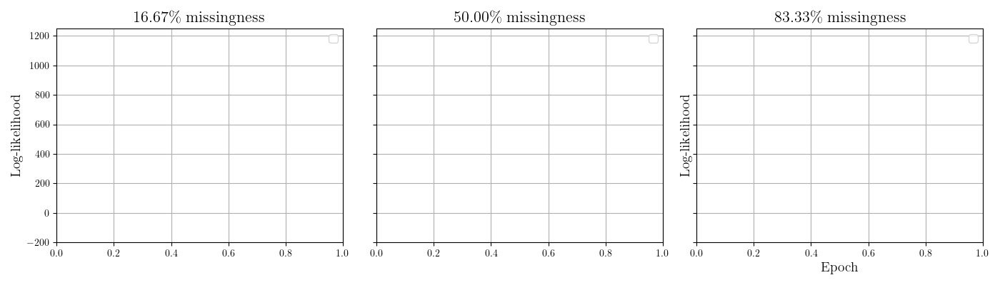

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


In [25]:
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey=True, figsize=(14, 4))
axes = axes.flatten()
# axes = [axes]
gs = [1, 3, 5]
# gs = [1]
for i, g in enumerate(gs):
    stats = read_suite_stats_val(group=g, suite=suite, seed=exp_seed_keys[0], val_ckpts=val_ckpts, filename='summary.csv')

    axes[i].set_title(label=f'{g/6*100:.2f}\% missingness', fontdict={'fontsize': 16})
    if i in (0, 2):
        ylabel = 'Log-likelihood'
    else:
        ylabel=None

    if i in (2, 3):
        xlabel='Epoch'
    else:
        xlabel=None
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=('train_log_lik',),
                    err_keys=(None,),
                    xlabel=xlabel,
                    ylabel=ylabel, 
                    no_label=True,
                    ylim=(-200, 1250))

# axes[0].set_xlim(left=-5, right=255)
# axes[1].set_xlim(left=-5, right=255)
# axes[2].set_xlim(left=-5, right=255)

fig.tight_layout()

### Var. model pretraining learning curve

In [45]:
suite = {
    'Shared Var': 'svar_pretraining',
}

<IPython.core.display.Javascript object>


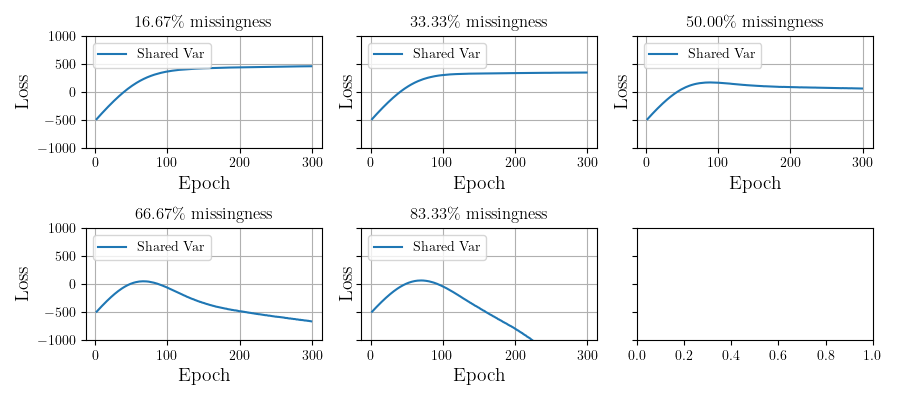

In [47]:
y_metrics = ('val_log_lik',#)
            'val_log_lik_0',
            'val_log_lik_1',
            'val_log_lik_2',
            'val_log_lik_3',
            'val_log_lik_4',
            'val_log_lik_5')
err_metrics = (None, None, None, None, None, None, None)
metric_labels = None

fig, axes = plt.subplots(nrows=2, ncols=3, sharey=True, figsize=(9, 4))
# axes = [axes]
axes = axes.flatten()
gs = [1, 2, 3, 4, 5]
# gs = [1, 3, 5]
# gs = [5]
for i, g in enumerate(gs):
    axes[i].set(title=f'{g/6*100:.2f}\% missingness')
    stats = read_suite_stats(group=g, suite=suite, seed=exp_seed_keys[0], filename='summary.csv')
    
    plot_comparison(axes[i], stats, 
                    x_metric_key='curr_epoch',
                    y_metric_keys=y_metrics,  
                    err_keys=err_metrics,
                    metric_labels=metric_labels,
                    xlabel='Epoch',
                    ylabel='Loss', 
                    ylim=(-1000, 1000),
                    colors_instead_styles=False)

    axes[i].legend(loc='upper left')

fig.tight_layout()

### Total Time

In [46]:
suite = {
    'VGI': 'fcvae_pretrained_svar_cdi_const',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise',
#     'MICE': 'fcvae_mice_baseline',
    'MVAE': 'fc_mvae',
    'HI-VAE': 'fc_hivae',
    'PartialVAE+': 'fc_pvae_noaggact',
    'MIWAE': 'fc_miwae',
}

final_epochs = {
    'VGI': ['last', 'last', 'last', 'last', 'last'],
#     'VGI-VAE': ['last', 'last', 'last', 2750, 1000],
    'VBGI-VAE': ['last', 'last', 'last', 'last', 'last'],
    'VBGI-VAE-M': ['last', 'last', 'last', 'last', 1000],
    
    'MVAE': ['last', 'last', 'last', 1000, 500],
    'HI-VAE': ['last', 'last', 'last', 1000, 500],
    'PartialVAE+': ['last', 'last', 'last', 1500, 500],
    'MIWAE': ['last', 'last', 'last', 1000, 500],
}

<IPython.core.display.Javascript object>


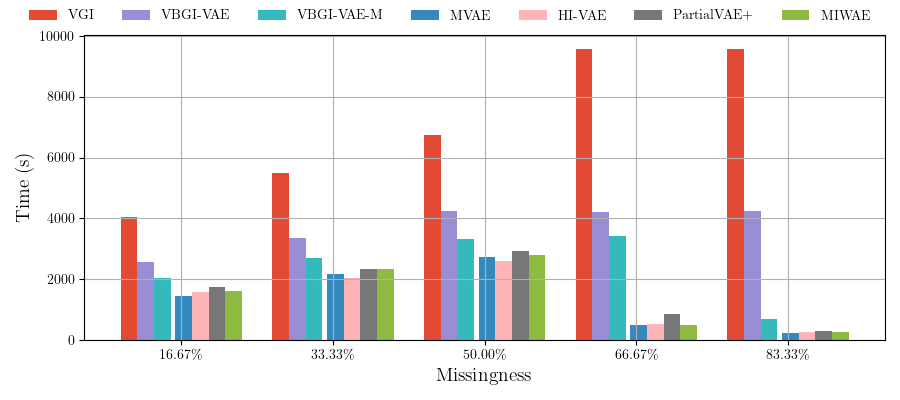

In [51]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(9, 4))
gs = [1, 2, 3, 4, 5]

stats = defaultdict(lambda: defaultdict(list))
for i, g in enumerate(gs):
    stats_g = read_suite_stats_with_init_all_seeds(group=g, suite=suite)
    for m, s in stats_g.items():
        if final_epochs[m][g-1] == 'last':
            time = np.sum(s['train_time'], axis=1)
        else:
            # If we early-stopping, count time until stopped
            time = np.sum(np.array(s['train_time'])[:, :final_epochs[m][g-1]], axis=1)

        stats[m]['train_time'].append(time.mean())
        stats[m]['train_time_stderr'].append(time.std(ddof=1)/np.sqrt(len(time)))
        stats[m]['group'].append(g)
    
barplot_comparison(axes, stats, width=0.11,
                    x_metric_key='group',
                    y_metric_keys=('train_time',),  
                    err_keys=(None,),
                    xlabel='Missingness',
                    ylabel='Time (s)', 
                    colors=colors[1:4] + colors[5:],
                    gap=0.03, gap_idxs=[2]
                  )

axes.set_xticks(gs)
axes.set_xticklabels(list(f'{g/6*100:.2f}\\%' for g in gs))

fig.tight_layout(rect=(0, 0, 1, 0.96))

handles, labels = axes.get_legend_handles_labels()

# Add empty label to separate VGI-based methods from the rest
# handles = handles[:3] + [mpl.lines.Line2D([0],[0],color="w")] + handles[3:]
# labels = labels[:3] + [""] + labels[3:]

axes.legend(handles, labels,
            ncol=7, bbox_to_anchor=(0.5, 0.96), bbox_transform=fig.transFigure, loc='center', 
            frameon=False)

In [52]:
# fig.savefig('figures/fcvae_frey_total_time.pdf', bbox_inches='tight')

### Time per epoch

In [53]:
suite = {
    'VGI': 'fcvae_pretrained_svar_cdi_const',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise',
#     'MICE': 'fcvae_mice_baseline',
    'MVAE': 'fc_mvae',
    'HI-VAE': 'fc_hivae',
    'PartialVAE+': 'fc_pvae_noaggact',
    'MIWAE': 'fc_miwae',
}

imp_time_suite = {
    'VGI': 'fcvae_pretrained_svar_cdi_const_time',
#     'VGI-VAE': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_time',
    'VBGI-VAE': 'fcvae_mcimp_bvgi2_vardecinputxmask_k5_g1',
    'VBGI-VAE-M': 'fcvae_mcimp_marginalise', 
}

final_epochs = {
    'VGI': ['last', 'last', 'last', 'last', 'last'],
#     'VGI-VAE': ['last', 'last', 'last', 2750, 1000],
    'VBGI-VAE': ['last', 'last', 'last', 'last', 'last'],
    'VBGI-VAE-M': ['last', 'last', 'last', 'last', 1000],
    
    'MVAE': ['last', 'last', 'last', 1000, 500],
    'HI-VAE': ['last', 'last', 'last', 1000, 500],
    'PartialVAE+': ['last', 'last', 'last', 1500, 500],
    'MIWAE': ['last', 'last', 'last', 1000, 500],
}

<IPython.core.display.Javascript object>


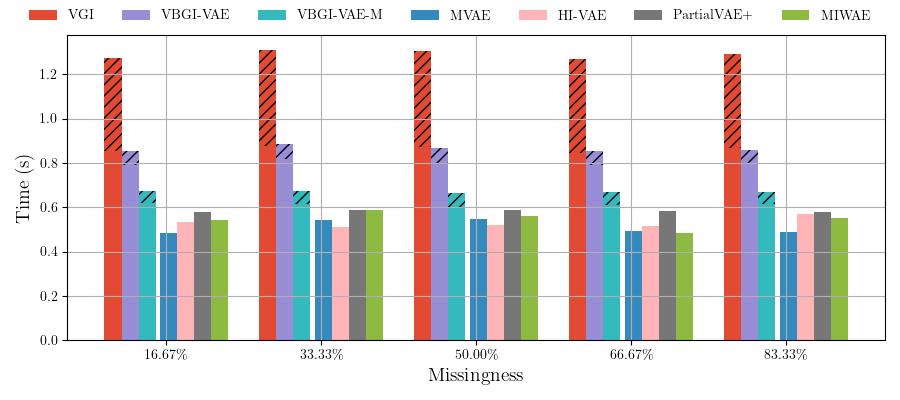

In [54]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(9, 4))
gs = [1, 2, 3, 4, 5]

stats = defaultdict(lambda: defaultdict(list))
for i, g in enumerate(gs):
    stats_g = read_suite_stats_with_init_all_seeds(group=g, suite=suite)
    for m in suite.keys():
        # add padding for other methods
        if m in imp_time_suite:
            stats[m]['train_time'].append(0)
            stats[m]['group'].append(g)
        else:
            s = stats_g[m]
            if final_epochs[m][g-1] == 'last':
                time = np.mean(s['train_time'], axis=1)
            else:
                # If we early-stopping, count time until stopped
                time = np.mean(np.array(s['train_time'])[:, :final_epochs[m][g-1]], axis=1)

            stats[m]['train_time'].append(time.mean())
            stats[m]['group'].append(g)

# Imputation time in VGI methods
imp_stats = defaultdict(lambda: defaultdict(list))
for i, g in enumerate(gs):
    stats_g = read_suite_stats_with_init(group=g, suite=imp_time_suite, seed=exp_seed_keys[0])
    for m in suite.keys():
        # add padding for other methods
        if m not in imp_time_suite:
            imp_stats[m]['train_time_minus_imp_time'].append(0)
            imp_stats[m]['group'].append(g)
        else:
            s = stats_g[m]
            if final_epochs[m][g-1] == 'last':
                imp_time = np.array(s['train_imp_time'])
                train_time = np.array(s['train_time'])
                time = train_time - imp_time
            else:
                # If we early-stopping, count time until stopped
                imp_time = np.array(s['train_imp_time'])[:final_epochs[m][g-1]]
                train_time = np.array(s['train_time'])[:final_epochs[m][g-1]]
                time = train_time - imp_time

            imp_stats[m]['train_time_minus_imp_time'].append(np.mean(time))
            imp_stats[m]['train_time'].append(np.mean(train_time))
            imp_stats[m]['train_imp_time'].append(np.mean(imp_time))
            imp_stats[m]['group'].append(g)
        
barplot_comparison(axes, imp_stats, width=0.11,
                   gap=0.03, gap_idxs=[2],
                    x_metric_key='group',
                    y_metric_keys=('train_imp_time',),  
                    err_keys=(None,),
                    y_bott_keys=('train_time_minus_imp_time',),
                    xlabel='Missingness',
                    ylabel='Time (s)', 
                    colors=colors[1:4] + colors[5:],
                    hatches=['///']*3 + [None]*4,
                    alpha=0.999  # Workaround for hatches disappearing when rendering to pdf
                  )
    
barplot_comparison(axes, imp_stats, width=0.11,
                   gap=0.03, gap_idxs=[2],
                    x_metric_key='group',
                    y_metric_keys=('train_time_minus_imp_time',),  
                    err_keys=(None,),
                    xlabel=None,
                    ylabel=None, 
                    colors=colors[1:4] + colors[5:],
                  )

barplot_comparison(axes, stats, width=0.11,
                   gap=0.03, gap_idxs=[2],
                    x_metric_key='group',
                    y_metric_keys=('train_time',),  
                    err_keys=(None,),
                    xlabel='Missingness',
                    ylabel='Time (s)', 
                    colors=colors[1:4] + colors[5:],
#                     hatches=['///']*2 + [None]*4
                  )

# axes.grid()
axes.set_xticks(gs)
axes.set_xticklabels(list(f'{g/6*100:.2f}\\%' for g in gs))

fig.tight_layout(rect=(0, 0, 1, 1.13))

handles, labels = axes.get_legend_handles_labels()

handles = handles[-7:]
labels = labels[-7:]

# Add empty label to separate VGI-based methods from the rest
# handles = handles[:3] + [mpl.lines.Line2D([0],[0],color="w")] + handles[3:]
# labels = labels[:3] + [""] + labels[3:]

axes.legend(handles, labels,
            ncol=7, bbox_to_anchor=(0.5, 0.96), bbox_transform=fig.transFigure, loc='center', 
            frameon=False)

In [55]:
for m, s in imp_stats.items():
    imp_stats[m]['train_time'] = np.mean(imp_stats[m]['train_time'])
    imp_stats[m]['train_imp_time'] = np.mean(imp_stats[m]['train_imp_time'])

print('VGI:',imp_stats['VGI']['train_imp_time'] / imp_stats['VGI']['train_time'])
print('VBGI-VAE:', imp_stats['VBGI-VAE']['train_imp_time'] / imp_stats['VBGI-VAE']['train_time'])
print('VBGI-VAE-M:', imp_stats['VBGI-VAE-M']['train_imp_time'] / imp_stats['VBGI-VAE-M']['train_time'])

VGI: 0.33145276864921197
VBGI-VAE: 0.07582846447628136
VBGI-VAE-M: 0.08552907757244049


/home/vaidas/anaconda3/envs/cdi/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/vaidas/anaconda3/envs/cdi/lib/python3.8/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [56]:
for m, s in stats.items():
    stats[m]['train_time'] = np.mean(stats[m]['train_time'])

vae_specific = ['MVAE', 'HI-VAE', 'PartialVAE+', 'MIWAE']
stats['VAE_spec']['train_time'] = []
for m in vae_specific:
    stats['VAE_spec']['train_time'].append(stats[m]['train_time'])
stats['VAE_spec']['train_time'] = np.mean(stats['VAE_spec']['train_time'])

print('VGI:', imp_stats['VGI']['train_time'] / stats['VAE_spec']['train_time'])
print('VBGI-VAE:', imp_stats['VBGI-VAE']['train_time'] / stats['VAE_spec']['train_time'])
print('VBGI-VAE-M:', imp_stats['VBGI-VAE-M']['train_time'] / stats['VAE_spec']['train_time'])

VGI: 2.3770305636359037
VBGI-VAE: 1.5934883506393942
VBGI-VAE-M: 1.2341323366377224


In [57]:
print('VGI:',imp_stats['VGI']['train_imp_time'] / (imp_stats['VGI']['train_time']-stats['VAE_spec']['train_time']))
print('VBGI-VAE:', imp_stats['VBGI-VAE']['train_imp_time'] / (imp_stats['VBGI-VAE']['train_time']-stats['VAE_spec']['train_time']))
print('VBGI-VAE-M:', imp_stats['VBGI-VAE-M']['train_imp_time'] / (imp_stats['VBGI-VAE-M']['train_time']-stats['VAE_spec']['train_time']))

VGI: 0.572153866651021
VBGI-VAE: 0.2035958661356191
VBGI-VAE-M: 0.4508313625993112


In [45]:
# fig.savefig('figures/fcvae_frey_time_per_epoch.pdf', bbox_inches='tight')

#### Relaxed vs not relaxed variational model

In [10]:
suite = {
    'extended conditionals': 'fcvae_pretrained_svar_cdi_const',
#     'VGI-VAE relaxed conditionals': 'fcvae_pretrained_svar_cdi_marginalise_k5_const',
    'Gibbs conditionals': 'fcvae_pretrained_svar_cdi_const_slow',
#     'VGI-VAE Gibbs conditionals': 'fcvae_pretrained_svar_cdi_marginalise_k5_const_slow',
}

final_epochs = {
    'extended conditionals': ['last', 'last', 'last', 'last', 'last'],
#     'VGI-VAE relaxed conditionals': ['last', 'last', 'last', 2750, 1000],
    'Gibbs conditionals': ['last', 'last', 'last', 'last', 'last'],
#     'VGI-VAE Gibbs conditionals': ['last', 'last', 'last', 2750, 1000],
}

<IPython.core.display.Javascript object>


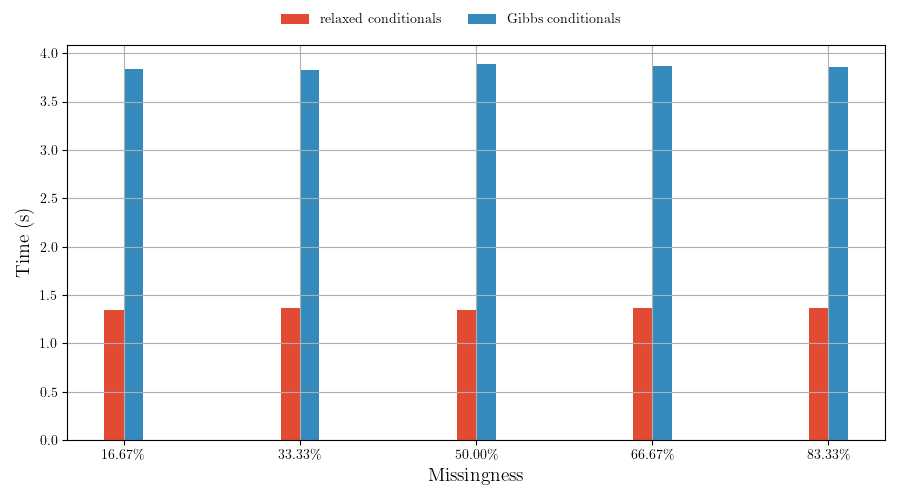

In [85]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(9, 5))
gs = [1, 2, 3, 4, 5]

stats = defaultdict(lambda: defaultdict(list))
for i, g in enumerate(gs):
    stats_g = read_suite_stats_with_init_all_seeds(group=g, suite=suite)
    for m, s in stats_g.items():
        if final_epochs[m][g-1] == 'last':
            time = np.mean(s['train_time'], axis=1)
        else:
            # If we early-stopping, count time until stopped
            time = np.mean(np.array(s['train_time'])[:, :final_epochs[m][g-1]], axis=1)

        stats[m]['train_time'].append(time.mean())
        stats[m]['group'].append(g)
    
barplot_comparison(axes, stats, width=0.11,
                    x_metric_key='group',
                    y_metric_keys=('train_time',),  
                    err_keys=(None,),
                    xlabel='Missingness',
                    ylabel='Time (s)', 
                    colors=[colors[1], colors[4]],
                  )

axes.set_xticks(gs)
axes.set_xticklabels(list(f'{g/6*100:.2f}\\%' for g in gs))

fig.tight_layout(rect=(0, 0, 1, 0.94))

axes.legend(ncol=4, bbox_to_anchor=(0.5, 0.96), bbox_transform=fig.transFigure, loc='center', 
                  frameon=False)

In [86]:
np.array(stats['Gibbs conditionals']['train_time'])  / np.array(stats['relaxed conditionals']['train_time'])

array([2.84553033, 2.79039988, 2.8854913 , 2.83346104, 2.82375422])

#### Model test log-likelihood (relaxed vs not relaxed)

In [11]:
suite_bar = {
    'shared extended': 'refit_fcvae_pretrained_svar_cdi_const',
    'shared standard': 'refit_fcvae_pretrained_svar_cdi_const_slow',
}
gs = [1, 2, 3, 4, 5]

<IPython.core.display.Javascript object>


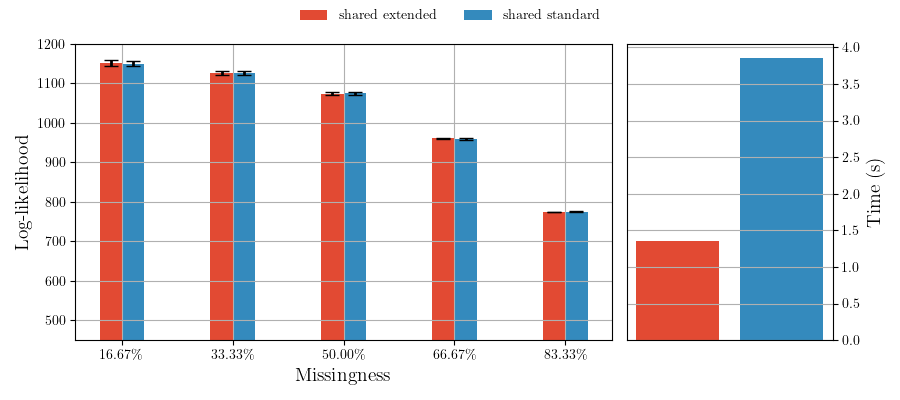

<ipython-input-12-329a18b7450f>:58: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout(rect=(0, 0, 1, 0.94))


In [12]:
fig = plt.figure(constrained_layout=True, figsize=(9, 4))
gridspec = fig.add_gridspec(1, 7)
axes = []
axes.append(fig.add_subplot(gridspec[:5]))
axes.append(fig.add_subplot(gridspec[5:]))

# ggplot
colors = ['#E24A33', '#348ABD',]
    
stats_bar = {}
# Load stats for every experiment in the suite
for exp_name, model_name in suite_bar.items():
    stats_bar[exp_name] = compute_avg_loglikelihood_w_std_err(model_name, 
                                                              seeds=exp_seed_keys,
                                                              groups=gs,
                                                              base_path=log_path_base)
    
barplot_comparison(axes[0], stats_bar, width=0.2,
                    x_metric_key='group',
                    y_metric_keys=('test_log_lik',),  
                    err_keys=('test_log_lik_stderr',),
                    xlabel='Missingness',
                    ylabel='Log-likelihood', 
                    colors=colors,
                    ylim=(450, 1200),
#                       gap=0.02, gap_idx=1
                  )

axes[0].set_xticks(gs)
axes[0].set_xticklabels(list(f'{g/6*100:.2f}\\%' for g in gs))


stats_time = defaultdict(lambda: defaultdict(list))
for i, g in enumerate(gs):
    stats_g = read_suite_stats_with_init_all_seeds(group=g, suite=suite)
    for m, s in stats_g.items():
        if final_epochs[m][g-1] == 'last':
            time = np.mean(s['train_time'], axis=1)
        else:
            # If we early-stopping, count time until stopped
            time = np.mean(np.array(s['train_time'])[:, :final_epochs[m][g-1]], axis=1)

        stats_time[m]['train_time'].append(time.mean())

for i, (m, s) in enumerate(stats_time.items()):
    avg_time = np.mean(stats_time[m]['train_time'])
    
    axes[1].bar(m, avg_time, color=colors[i])

axes[1].set_xticks([])
axes[1].yaxis.tick_right()
axes[1].yaxis.set_label_position("right")
axes[1].set_ylabel('Time (s)', fontsize=14)
# plt.setp(axes[1].get_xticklabels(), rotation=45, ha="right",
#          rotation_mode="anchor")
axes[1].grid()
    
fig.tight_layout(rect=(0, 0, 1, 0.94))

axes[0].legend(ncol=4, bbox_to_anchor=(0.5, 0.96), bbox_transform=fig.transFigure, loc='center', 
                  frameon=False)

In [13]:
# fig.savefig('figures/fcvae_frey_time_and_loglik_relaxed_vs_not_relaxed.pdf', bbox_inches='tight')